In [1]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as td
import torchvision as tv
from PIL import Image
import matplotlib.pyplot as plt
import nntools as nt

# Global Vriables

In [2]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

VOC2012_CLASSES = (  # always index 0 
#     'background',
    'aeroplane', 'bicycle', 'bird', 'boat','bottle', 
    'bus', 'car', 'cat', 'chair','cow', 
    'diningtable', 'dog', 'horse', 'motorbike', 'person', 
    'pottedplant','sheep', 'sofa', 'train', 'tvmonitor')

VOC2012_ROOT = "../dataset"

voc = {
    'num_classes': 21,
    'lr_steps': (80000, 100000, 120000),
    'max_iter': 120000,
    'feature_maps': [38, 19, 10, 5, 3, 1],
    'min_dim': 300,
    'steps': [8, 16, 32, 64, 100, 300],
    'min_sizes': [30, 60, 111, 162, 213, 264],
    'max_sizes': [60, 111, 162, 213, 264, 315],
    'aspect_ratios': [[2], [2, 3], [2, 3], [2, 3], [2], [2]],
    'variance': [0.1, 0.2],
    'clip': True,
    'name': 'VOC',
}


batch_size=64

# Loading Data

## Dataset 

In [3]:
import os
import sys
import tarfile
import collections

if sys.version_info[0] == 2:
    import xml.etree.cElementTree as ET
else:
    import xml.etree.ElementTree as ET

from PIL import Image

class VOCDetection(tv.datasets.VOCDetection):
    def __init__(self, root, year='2012', image_set='train', download=False, image_size=voc['min_dim']):
        super(VOCDetection, self).__init__(root, year, image_set, download)
        self.image_size = image_size
        self.class_to_ind = dict(zip(VOC2012_CLASSES, range(len(VOC2012_CLASSES))))
    def __getitem__(self, index):
        """
        Args:
            index (int): Index

        Returns:
            tuple: (image, target) where target is a dictionary of the XML tree.
        """
        img = Image.open(self.images[index]).convert('RGB')
        width, height = img.size
        # since there are some data files have been damaged, 
        # we give lead it to a another backup datset
        try:
            target = self.parse_voc_xml(
                ET.parse(self.annotations[index]).getroot())
        except:
            annotation_path = '/datasets/ee285f-public/PascalVOC2012/Annotations/'
            annotation_path += self.annotations[index].split('/')[-1]
            target = self.parse_voc_xml(
                ET.parse(annotation_path).getroot())
        img_transform = tv.transforms.Compose([
            tv.transforms.Resize((self.image_size,self.image_size)),
            tv.transforms.ToTensor(),
            ])
        img = img_transform(img)
        label = []
        if type(target['annotation']['object']) == list:
            for obj in target['annotation']['object']:
                name = obj['name']
                bbox = obj['bndbox']

                pts = ['xmin', 'ymin', 'xmax', 'ymax']
                bndbox = []
                for i, pt in enumerate(pts):
                    cur_pt = int(bbox[pt]) - 1
                    # scale height or width
                    cur_pt = cur_pt / width if i % 2 == 0 else cur_pt / height
                    bndbox.append(cur_pt)
                label_idx = self.class_to_ind[name]
                bndbox.append(label_idx)
                label += [bndbox]
        elif type(target['annotation']['object']) == dict:
            obj = target['annotation']['object']
            name = obj['name']
            bbox = obj['bndbox']

            pts = ['xmin', 'ymin', 'xmax', 'ymax']
            bndbox = []
            for i, pt in enumerate(pts):
                cur_pt = int(bbox[pt]) - 1
                # scale height or width
                cur_pt = cur_pt / width if i % 2 == 0 else cur_pt / height
                bndbox.append(cur_pt)
            label_idx = self.class_to_ind[name]
            bndbox.append(label_idx)
            label += [bndbox]
        return img, label, height, width

In [4]:
train_dataset = VOCDetection(VOC2012_ROOT, year='2012', image_set='train', download=False)
val_dataset = VOCDetection(VOC2012_ROOT, year='2012', image_set='val', download=False)
trainval_dataset = VOCDetection(VOC2012_ROOT, year='2012', image_set='trainval', download=False)
test_dataset = VOCDetection(VOC2012_ROOT, year='2012', image_set='test', download=False)

## DataLoader

In [5]:
def detection_collate(batch):
    """Custom collate fn for dealing with batches of images that have a different
    number of associated object annotations (bounding boxes).
    Arguments:
        batch: (tuple) A tuple of tensor images and lists of annotations
    Return:
        A tuple containing:
            1) (tensor) batch of images stacked on their 0 dim
            2) (list of tensors) annotations for a given image are stacked on
                                 0 dim
    """
    target = []
    imgs = []
    for sample in batch:
        imgs.append(sample[0])
        target.append(torch.FloatTensor(sample[1]))
    imgs = torch.stack(imgs, 0)
    return imgs, target
## imgs: tensor, batch_size*3*300*300
## targets: list(tensor), []

In [6]:
train_loader = td.DataLoader(dataset = train_dataset, batch_size=batch_size, shuffle=True, 
                             collate_fn=detection_collate, pin_memory=True)
val_loader = td.DataLoader(dataset = val_dataset, batch_size=batch_size, shuffle=False, 
                             collate_fn=detection_collate, pin_memory=True)
trainval_loader = td.DataLoader(dataset = trainval_dataset, batch_size=batch_size, shuffle=True, 
                             collate_fn=detection_collate, pin_memory=True)
test_loader = td.DataLoader(dataset = test_dataset, batch_size=batch_size, shuffle=False, 
                             collate_fn=detection_collate, pin_memory=True)

In [7]:
import random
def plt_GroundTruth(img, label, figsize=(5,5), linewidth=1.5):
    """Visualize bounding boxes. Largely inspired by SSD-MXNET!
        """
    fig = plt.figure(figsize=figsize)
    plt.imshow(img)
    height = img.shape[0]
    width = img.shape[1]
    colors = dict()
    for i in range(label.shape[0]):
        cls_id = int(label[i][4])
        if cls_id >= 0:
            if cls_id not in colors:
                colors[cls_id] = (random.random(), random.random(), random.random())
            xmin = int(label[i][0] * height)
            ymin = int(label[i][1] * width)
            xmax = int(label[i][2] * height)
            ymax = int(label[i][3] * width)
            rect = plt.Rectangle((xmin, ymin), xmax - xmin,
                                 ymax - ymin, fill=False,
                                 edgecolor=colors[cls_id],
                                 linewidth=linewidth)
            plt.gca().add_patch(rect)
            class_name = VOC2012_CLASSES[cls_id]
            plt.gca().text(xmin, ymin - 2,'{:s}'.format(class_name),
                           bbox=dict(facecolor=colors[cls_id], alpha=0.5),
                           fontsize=12, color='white')
    plt.show()

Mini-Batch NO.: 0
label: tensor([[ 0.1800,  0.0931,  0.9550,  0.9615, 11.0000]])


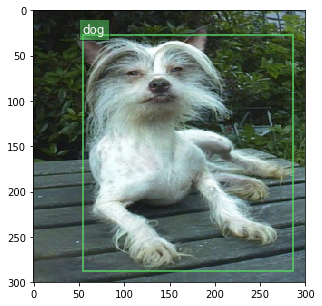

Mini-Batch NO.: 1
label: tensor([[ 0.1580,  0.5409,  0.6220,  0.9971, 10.0000],
        [ 0.5840,  0.6813,  0.8900,  0.9971,  8.0000],
        [ 0.0000,  0.5702,  0.2460,  0.9971,  8.0000],
        [ 0.0160,  0.3216,  0.2760,  0.9737, 14.0000],
        [ 0.2960,  0.2865,  0.4780,  0.5614, 14.0000],
        [ 0.4860,  0.2661,  0.7060,  0.7544, 14.0000],
        [ 0.3820,  0.3684,  0.8720,  0.9971, 14.0000]])


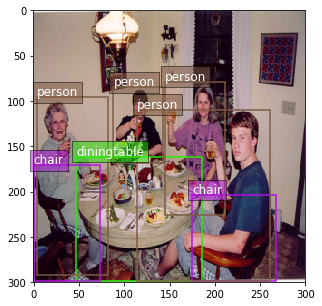

Mini-Batch NO.: 2
label: tensor([[ 0.3860,  0.3600,  0.7800,  0.6853, 11.0000],
        [ 0.1640,  0.4907,  0.4340,  0.7200,  7.0000],
        [ 0.0000,  0.1973,  0.9700,  0.9973, 17.0000]])


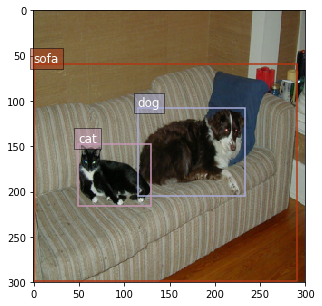

Mini-Batch NO.: 3
label: tensor([[ 0.0700,  0.2427,  0.2320,  0.3867, 16.0000],
        [ 0.6460,  0.3440,  0.8760,  0.6427, 16.0000],
        [ 0.4360,  0.4160,  0.6880,  0.6373, 16.0000]])


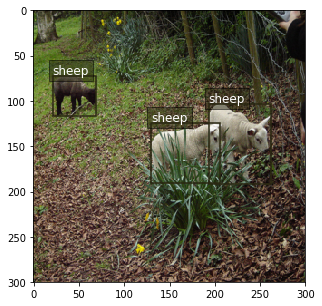

In [8]:
## loading demo
for i_batch, sample_batched in enumerate(train_loader):
    if i_batch > 0:
        break
    print("Mini-Batch NO.:", i_batch)
    x,target = sample_batched
#     print(x.shape)
    img = x[0].to('cpu').numpy()
    img = np.moveaxis(img, [0, 1, 2], [2, 0, 1])
#     plt.imshow(img)
#     plt.show()
    print("label:",target[0])
    plt_GroundTruth(img, target[0])

# SSD300 Architecture

## PriorBox

In [8]:
from math import sqrt as sqrt
from itertools import product as product
import torch


class PriorBox(object):
    """Compute priorbox coordinates in center-offset form for each source
    feature map.
    """
    def __init__(self, cfg):
        super(PriorBox, self).__init__()
        self.image_size = cfg['min_dim']
        # number of priors for feature map location (either 4 or 6)
        self.num_priors = len(cfg['aspect_ratios'])
        self.variance = cfg['variance'] or [0.1]
        self.feature_maps = cfg['feature_maps']
        self.min_sizes = cfg['min_sizes']
        self.max_sizes = cfg['max_sizes']
        self.steps = cfg['steps']
        self.aspect_ratios = cfg['aspect_ratios']
        self.clip = cfg['clip']
        self.version = cfg['name']
        for v in self.variance:
            if v <= 0:
                raise ValueError('Variances must be greater than 0')

    def forward(self):
        mean = []
        for k, f in enumerate(self.feature_maps):
            for i, j in product(range(f), repeat=2):
                f_k = self.image_size / self.steps[k]
                # unit center x,y
                cx = (j + 0.5) / f_k
                cy = (i + 0.5) / f_k

                # aspect_ratio: 1
                # rel size: min_size
                s_k = self.min_sizes[k]/self.image_size
                mean += [cx, cy, s_k, s_k]

                # aspect_ratio: 1
                # rel size: sqrt(s_k * s_(k+1))
                s_k_prime = sqrt(s_k * (self.max_sizes[k]/self.image_size))
                mean += [cx, cy, s_k_prime, s_k_prime]

                # rest of aspect ratios
                for ar in self.aspect_ratios[k]:
                    mean += [cx, cy, s_k*sqrt(ar), s_k/sqrt(ar)]
                    mean += [cx, cy, s_k/sqrt(ar), s_k*sqrt(ar)]
                    
        # back to torch land
        output = torch.Tensor(mean).view(-1, 4)
        if self.clip:
            output.clamp_(max=1, min=0)
        return output # 8732*4, (x_min, y_min, x_max, y_max) or (x_center, y_center, width, height)

## SSD300

In [9]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
# import prior_box
import l2norm
import os



class SSD(nn.Module):
    """Single Shot Multibox Architecture
    The network is composed of a base VGG network followed by the
    added multibox conv layers.  Each multibox layer branches into
        1) conv2d for class conf scores
        2) conv2d for localization predictions
        3) associated priorbox layer to produce default bounding
           boxes specific to the layer's feature map size.
    See: https://arxiv.org/pdf/1512.02325.pdf for more details.
    Args:
        phase: (string) Can be "test" or "train"
        size: input image size
        base: VGG16 layers for input, size of either 300 or 500
        extras: extra layers that feed to multibox loc and conf layers
        head: "multibox head" consists of loc and conf conv layers
    """

    def __init__(self, phase, size, base, extras, head, num_classes=21):
        super(SSD, self).__init__()
        self.phase = phase
        self.num_classes = num_classes
        self.cfg = voc
        self.priorbox = PriorBox(self.cfg)
        self.priors = Variable(self.priorbox.forward(), requires_grad=False)
        self.size = size

        # SSD network
        self.vgg = nn.ModuleList(base)
        # Layer learns to scale the l2 normalized features from conv4_3
        self.L2Norm = l2norm.L2Norm(512, 20)
        self.extras = nn.ModuleList(extras)

        self.loc = nn.ModuleList(head[0])
        self.conf = nn.ModuleList(head[1])
        

    def forward(self, x):
        """Applies network layers and ops on input image(s) x.
        Args:
            x: input image or batch of images. Shape: [batch,3,300,300].
        Return:
            Depending on phase:
            test:
                Variable(tensor) of output class label predictions,
                confidence score, and corresponding location predictions for
                each object detected. Shape: [batch,topk,7]
            train:
                list of concat outputs from:
                    1: confidence layers, Shape: [batch*num_priors,num_classes]
                    2: localization layers, Shape: [batch,num_priors*4]
                    3: priorbox layers, Shape: [2,num_priors*4]
        """
        sources = list()
        loc = list()
        conf = list()

        # apply vgg up to conv4_3 relu
        for k in range(23):
            x = self.vgg[k](x)

        s = self.L2Norm(x)
        sources.append(s)

        # apply vgg up to fc7
        for k in range(23, len(self.vgg)):
            x = self.vgg[k](x)
        sources.append(x)

        # apply extra layers and cache source layer outputs
        for k, v in enumerate(self.extras):
            x = F.relu(v(x), inplace=True)
            if k % 2 == 1:
                sources.append(x)

        # apply multibox head to source layers
        for (x, l, c) in zip(sources, self.loc, self.conf):
            loc.append(l(x).permute(0, 2, 3, 1).contiguous())
            conf.append(c(x).permute(0, 2, 3, 1).contiguous())

        loc = torch.cat([o.view(o.size(0), -1) for o in loc], 1)
        conf = torch.cat([o.view(o.size(0), -1) for o in conf], 1)
        if self.phase == "val":
            output = self.detect(
                loc.view(loc.size(0), -1, 4),                   # loc preds
                self.softmax(conf.view(conf.size(0), -1,
                             self.num_classes)),                # conf preds
                self.priors.type(type(x.data))                  # default boxes
            )
        else:
            output = (
                loc.view(loc.size(0), -1, 4),
                conf.view(conf.size(0), -1, self.num_classes),
                self.priors
            )
        return output

#     def load_weights(self, base_file):
#         other, ext = os.path.splitext(base_file)
#         if ext == '.pkl' or '.pth':
#             print('Loading weights into state dict...')
#             self.load_state_dict(torch.load(base_file,
#                                  map_location=lambda storage, loc: storage))
#             print('Finished!')
#         else:
#             print('Sorry only .pth and .pkl files supported.')


# This function is derived from torchvision VGG make_layers()
# https://github.com/pytorch/vision/blob/master/torchvision/models/vgg.py
def vgg(cfg, in_channels, batch_norm=False):
    layers = []
    for v in cfg:
        if v == 'M':
            layers += [nn.MaxPool2d(kernel_size=2, stride=2)]
        elif v == 'C':
            layers += [nn.MaxPool2d(kernel_size=2, stride=2, ceil_mode=True)]
        else:
            conv2d = nn.Conv2d(in_channels, v, kernel_size=3, padding=1)
            if batch_norm:
                layers += [conv2d, nn.BatchNorm2d(v), nn.ReLU(inplace=True)]
            else:
                layers += [conv2d, nn.ReLU(inplace=True)]
            in_channels = v
    pool5 = nn.MaxPool2d(kernel_size=3, stride=1, padding=1)
    conv6 = nn.Conv2d(512, 1024, kernel_size=3, padding=6, dilation=6)
    conv7 = nn.Conv2d(1024, 1024, kernel_size=1)
    layers += [pool5, conv6,
               nn.ReLU(inplace=True), conv7, nn.ReLU(inplace=True)]
    return layers


def add_extras(cfg, in_channels, batch_norm=False):
    # Extra layers added to VGG for feature scaling
    layers = []
    flag = False
    for k, v in enumerate(cfg):
        if in_channels != 'S':
            if v == 'S':
                layers += [nn.Conv2d(in_channels, cfg[k + 1],
                           kernel_size=(1, 3)[flag], stride=2, padding=1)]
            else:
                layers += [nn.Conv2d(in_channels, v, kernel_size=(1, 3)[flag])]
            flag = not flag
        in_channels = v
    return layers


def multibox(vgg, extra_layers, cfg, num_classes):
    loc_layers = []
    conf_layers = []
    vgg_source = [21, -2]
    for k, v in enumerate(vgg_source):
        loc_layers += [nn.Conv2d(vgg[v].out_channels,
                                 cfg[k] * 4, 
                                 kernel_size=3, 
                                 padding=1)]
        conf_layers += [nn.Conv2d(vgg[v].out_channels,
                                  cfg[k] * num_classes, 
                                  kernel_size=3, 
                                  padding=1)]
    for k, v in enumerate(extra_layers[1::2], 2):
        loc_layers += [nn.Conv2d(v.out_channels, 
                                 cfg[k]* 4, 
                                 kernel_size=3, 
                                 padding=1)]
        conf_layers += [nn.Conv2d(v.out_channels, 
                                  cfg[k] * num_classes,
                                  kernel_size=3, 
                                  padding=1)]
    return vgg, extra_layers, (loc_layers, conf_layers)


base = {
    '300': [64, 64, 'M', 128, 128, 'M', 256, 256, 256, 'C', 512, 512, 512, 'M',
            512, 512, 512],
    '512': [],
}
extras = {
    '300': [256, 'S', 512, 128, 'S', 256, 128, 256, 128, 256],
    '512': [],
}
mbox = {
    '300': [4, 6, 6, 6, 4, 4],  # number of boxes per feature map location
    '512': [],
}


def build_ssd(phase="train", size=300, num_classes=21):
    if phase != "val" and phase != "train":
        print("ERROR: Phase: " + phase + " not recognized")
        return
    base_, extras_, head_ = multibox(vgg(base[str(size)], 3),
                                     add_extras(extras[str(size)], 1024),
                                     mbox[str(size)], num_classes)
    return SSD(phase, size, base_, extras_, head_, num_classes)


## Criterion

### Matching Bounding Boxes

In [10]:
def point_form(boxes):
    """ Convert prior_boxes to (xmin, ymin, xmax, ymax)
    representation for comparison to point form ground truth data.
    Args:
        boxes: (tensor) center-size default boxes from priorbox layers.
    Return:
        boxes: (tensor) Converted xmin, ymin, xmax, ymax form of boxes.
    """
    return torch.cat((boxes[:, :2] - boxes[:, 2:]/2,     # xmin, ymin
                     boxes[:, :2] + boxes[:, 2:]/2), 1)  # xmax, ymax


def center_size(boxes):
    """ Convert prior_boxes to (cx, cy, w, h)
    representation for comparison to center-size form ground truth data.
    Args:
        boxes: (tensor) point_form boxes
    Return:
        boxes: (tensor) Converted xmin, ymin, xmax, ymax form of boxes.
    """
    return torch.cat((boxes[:, 2:] + boxes[:, :2])/2,  # cx, cy
                     boxes[:, 2:] - boxes[:, :2], 1)  # w, h


def intersect(box_a, box_b):
    """ We resize both tensors to [A,B,2] without new malloc:
    [A,2] -> [A,1,2] -> [A,B,2]
    [B,2] -> [1,B,2] -> [A,B,2]
    Then we compute the area of intersect between box_a and box_b.
    Args:
      box_a: (tensor) bounding boxes, Shape: [A,4].
      box_b: (tensor) bounding boxes, Shape: [B,4].
    Return:
      (tensor) intersection area, Shape: [A,B].
    """
    A = box_a.size(0)
    B = box_b.size(0)
    max_xy = torch.min(box_a[:, 2:].unsqueeze(1).expand(A, B, 2),
                       box_b[:, 2:].unsqueeze(0).expand(A, B, 2))
    min_xy = torch.max(box_a[:, :2].unsqueeze(1).expand(A, B, 2),
                       box_b[:, :2].unsqueeze(0).expand(A, B, 2))
    inter = torch.clamp((max_xy - min_xy), min=0)
    return inter[:, :, 0] * inter[:, :, 1]


def jaccard(box_a, box_b):
    """Compute the jaccard overlap of two sets of boxes.  The jaccard overlap
    is simply the intersection over union of two boxes.  Here we operate on
    ground truth boxes and default boxes.
    E.g.:
        A ∩ B / A ∪ B = A ∩ B / (area(A) + area(B) - A ∩ B)
    Args:
        box_a: (tensor) Ground truth bounding boxes, Shape: [num_objects,4]
        box_b: (tensor) Prior boxes from priorbox layers, Shape: [num_priors,4]
    Return:
        jaccard overlap: (tensor) Shape: [box_a.size(0), box_b.size(0)]
    """
    inter = intersect(box_a, box_b)
    area_a = ((box_a[:, 2]-box_a[:, 0]) *
              (box_a[:, 3]-box_a[:, 1])).unsqueeze(1).expand_as(inter)  # [A,B]
    area_b = ((box_b[:, 2]-box_b[:, 0]) *
              (box_b[:, 3]-box_b[:, 1])).unsqueeze(0).expand_as(inter)  # [A,B]
    union = area_a + area_b - inter
    return inter / union  # [A,B]


def match(threshold, truths, priors, variances, labels, loc_t, conf_t, idx):
    """Match each prior box with the ground truth box of the highest jaccard
    overlap, encode the bounding boxes, then return the matched indices
    corresponding to both confidence and location preds.
    Args:
        threshold: (float) The overlap threshold used when mathing boxes.
        truths: (tensor) Ground truth boxes, Shape: [num_obj, num_priors].
        priors: (tensor) Prior boxes from priorbox layers, Shape: [n_priors,4].
        variances: (tensor) Variances corresponding to each prior coord,
            Shape: [num_priors, 4].
        labels: (tensor) All the class labels for the image, Shape: [num_obj].
        loc_t: (tensor) Tensor to be filled w/ endcoded location targets.
        conf_t: (tensor) Tensor to be filled w/ matched indices for conf preds.
        idx: (int) current batch index
    Return:
        The matched indices corresponding to 1)location and 2)confidence preds.
    """
    # jaccard index
    overlaps = jaccard(
        truths,
        point_form(priors)
    )
    # (Bipartite Matching)
    # [1,num_objects] best prior for each ground truth
    best_prior_overlap, best_prior_idx = overlaps.max(1, keepdim=True)
    # [1,num_priors] best ground truth for each prior
    best_truth_overlap, best_truth_idx = overlaps.max(0, keepdim=True)
    best_truth_idx.squeeze_(0)
    best_truth_overlap.squeeze_(0)
    best_prior_idx.squeeze_(1)
    best_prior_overlap.squeeze_(1)
    best_truth_overlap.index_fill_(0, best_prior_idx, 2)  # ensure best prior
    # TODO refactor: index  best_prior_idx with long tensor
    # ensure every gt matches with its prior of max overlap
    for j in range(best_prior_idx.size(0)):
        best_truth_idx[best_prior_idx[j]] = j
    matches = truths[best_truth_idx]          # Shape: [num_priors,4]
    conf = labels[best_truth_idx] + 1         # Shape: [num_priors]
    conf[best_truth_overlap < threshold] = 0  # label as background
    loc = encode(matches, priors, variances)
    loc_t[idx] = loc    # [num_priors,4] encoded offsets to learn
    conf_t[idx] = conf # [num_priors] top class label for each prior


def encode(matched, priors, variances):
    """Encode the variances from the priorbox layers into the ground truth boxes
    we have matched (based on jaccard overlap) with the prior boxes.
    Args:
        matched: (tensor) Coords of ground truth for each prior in point-form
            Shape: [num_priors, 4].
        priors: (tensor) Prior boxes in center-offset form
            Shape: [num_priors,4].
        variances: (list[float]) Variances of priorboxes
    Return:
        encoded boxes (tensor), Shape: [num_priors, 4]
    """

    # dist b/t match center and prior's center
    g_cxcy = (matched[:, :2] + matched[:, 2:])/2 - priors[:, :2]
    # encode variance
    g_cxcy /= (variances[0] * priors[:, 2:])
    # match wh / prior wh
    g_wh = (matched[:, 2:] - matched[:, :2]) / priors[:, 2:]
    g_wh = torch.log(g_wh) / variances[1]
    # return target for smooth_l1_loss
    return torch.cat([g_cxcy, g_wh], 1)  # [num_priors,4]


# Adapted from https://github.com/Hakuyume/chainer-ssd
def decode(loc, priors, variances):
    """Decode locations from predictions using priors to undo
    the encoding we did for offset regression at train time.
    Args:
        loc (tensor): location predictions for loc layers,
            Shape: [num_priors,4]
        priors (tensor): Prior boxes in center-offset form.
            Shape: [num_priors,4].
        variances: (list[float]) Variances of priorboxes
    Return:
        decoded bounding box predictions
    """

    boxes = torch.cat((
        priors[:, :2] + loc[:, :2] * variances[0] * priors[:, 2:],
        priors[:, 2:] * torch.exp(loc[:, 2:] * variances[1])), 1)
    boxes[:, :2] -= boxes[:, 2:] / 2
    boxes[:, 2:] += boxes[:, :2]
    return boxes


def log_sum_exp(x):
    """Utility function for computing log_sum_exp while determining
    This will be used to determine unaveraged confidence loss across
    all examples in a batch.
    Args:
        x (Variable(tensor)): conf_preds from conf layers
    """
    x_max = x.data.max()
    return torch.log(torch.sum(torch.exp(x-x_max), 1, keepdim=True)) + x_max


# Original author: Francisco Massa:
# https://github.com/fmassa/object-detection.torch
# Ported to PyTorch by Max deGroot (02/01/2017)
def nms(boxes, scores, overlap=0.5, top_k=200):
    """Apply non-maximum suppression at test time to avoid detecting too many
    overlapping bounding boxes for a given object.
    Args:
        boxes: (tensor) The location preds for the img, Shape: [num_priors,4].
        scores: (tensor) The class predscores for the img, Shape:[num_priors].
        overlap: (float) The overlap thresh for suppressing unnecessary boxes.
        top_k: (int) The Maximum number of box preds to consider.
    Return:
        The indices of the kept boxes with respect to num_priors.
    """

    keep = scores.new(scores.size(0)).zero_().long()
    if boxes.numel() == 0:
        return keep
    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]
    area = torch.mul(x2 - x1, y2 - y1)
    v, idx = scores.sort(0)  # sort in ascending order
    # I = I[v >= 0.01]
    idx = idx[-top_k:]  # indices of the top-k largest vals
    xx1 = boxes.new()
    yy1 = boxes.new()
    xx2 = boxes.new()
    yy2 = boxes.new()
    w = boxes.new()
    h = boxes.new()

    # keep = torch.Tensor()
    count = 0
    while idx.numel() > 0:
        i = idx[-1]  # index of current largest val
        # keep.append(i)
        keep[count] = i
        count += 1
        if idx.size(0) == 1:
            break
        idx = idx[:-1]  # remove kept element from view
        # load bboxes of next highest vals
        torch.index_select(x1, 0, idx, out=xx1)
        torch.index_select(y1, 0, idx, out=yy1)
        torch.index_select(x2, 0, idx, out=xx2)
        torch.index_select(y2, 0, idx, out=yy2)
        # store element-wise max with next highest score
        xx1 = torch.clamp(xx1, min=x1[i])
        yy1 = torch.clamp(yy1, min=y1[i])
        xx2 = torch.clamp(xx2, max=x2[i])
        yy2 = torch.clamp(yy2, max=y2[i])
        w.resize_as_(xx2)
        h.resize_as_(yy2)
        w = xx2 - xx1
        h = yy2 - yy1
        # check sizes of xx1 and xx2.. after each iteration
        w = torch.clamp(w, min=0.0)
        h = torch.clamp(h, min=0.0)
        inter = w*h
        # IoU = i / (area(a) + area(b) - i)
        rem_areas = torch.index_select(area, 0, idx)  # load remaining areas)
        union = (rem_areas - inter) + area[i]
        IoU = inter/union  # store result in iou
        # keep only elements with an IoU <= overlap
        idx = idx[IoU.le(overlap)]
    return keep, count

### MultiBoxLoss

In [11]:
class MultiBoxLoss(nn.Module):
    """SSD Weighted Loss Function
    Compute Targets:
        1) Produce Confidence Target Indices by matching  ground truth boxes
           with (default) 'priorboxes' that have jaccard index > threshold parameter
           (default threshold: 0.5).
        2) Produce localization target by 'encoding' variance into offsets of ground
           truth boxes and their matched  'priorboxes'.
        3) Hard negative mining to filter the excessive number of negative examples
           that comes with using a large number of default bounding boxes.
           (default negative:positive ratio 3:1)
    Objective Loss:
        L(x,c,l,g) = (Lconf(x, c) + αLloc(x,l,g)) / N
        Where, Lconf is the CrossEntropy Loss and Lloc is the SmoothL1 Loss
        weighted by α which is set to 1 by cross val.
        Args:
            c: class confidences,
            l: predicted boxes,
            g: ground truth boxes
            N: number of matched default boxes
        See: https://arxiv.org/pdf/1512.02325.pdf for more details.
    """

    def __init__(self, num_classes, overlap_thresh, prior_for_matching,
                 bkg_label, neg_mining, neg_pos, neg_overlap, encode_target,
                 use_gpu=True):
        super(MultiBoxLoss, self).__init__()
        self.use_gpu = use_gpu
        self.num_classes = num_classes
        self.threshold = overlap_thresh
        self.background_label = bkg_label
        self.encode_target = encode_target
        self.use_prior_for_matching = prior_for_matching
        self.do_neg_mining = neg_mining
        self.negpos_ratio = neg_pos
        self.neg_overlap = neg_overlap
        self.variance = voc['variance']

    def forward(self, predictions, targets):
        """Multibox Loss
        Args:
            predictions (tuple): A tuple containing loc preds, conf preds,
            and prior boxes from SSD net.
                conf shape: torch.size(batch_size,num_priors,num_classes)
                loc shape: torch.size(batch_size,num_priors,4)
                priors shape: torch.size(num_priors,4)
            targets (tensor): Ground truth boxes and labels for a batch,
                shape: [batch_size,num_objs,5] (last idx is the label).
        """
        loc_data, conf_data, priors = predictions
        num = loc_data.size(0)
        priors = priors[:loc_data.size(1), :]
        num_priors = (priors.size(0))
        num_classes = self.num_classes

        # match priors (default boxes) and ground truth boxes
        loc_t = torch.Tensor(num, num_priors, 4)
        conf_t = torch.LongTensor(num, num_priors)
        for idx in range(num):
            truths = targets[idx][:, :-1].data
            labels = targets[idx][:, -1].data
            defaults = priors.data
            match(self.threshold, truths, defaults, self.variance, labels,
                  loc_t, conf_t, idx)
        if self.use_gpu:
            loc_t = loc_t.cuda()
            conf_t = conf_t.cuda()
        # wrap targets
        loc_t = Variable(loc_t, requires_grad=False)
        conf_t = Variable(conf_t, requires_grad=False)

        pos = conf_t > 0
        num_pos = pos.sum(dim=1, keepdim=True).double()

        # Localization Loss (Smooth L1)
        # Shape: [batch,num_priors,4]
        pos_idx = pos.unsqueeze(pos.dim()).expand_as(loc_data)
        loc_p = loc_data[pos_idx].view(-1, 4)#.double()
        loc_t = loc_t[pos_idx].view(-1, 4)#.double()
        loss_l = F.smooth_l1_loss(loc_p, loc_t, reduction="sum")#*(loc_p.shape[0]*loc_p.shape[1])#, size_average=False)

        # Compute max conf across batch for hard negative mining
        batch_conf = conf_data.view(-1, self.num_classes)
        loss_c = log_sum_exp(batch_conf) - batch_conf.gather(1, conf_t.view(-1, 1))

        # Hard Negative Mining
#         loss_c[pos] = 0  # filter out pos boxes for now
        loss_c = loss_c.view(num, -1)
        loss_c[pos] = 0  # filter out pos boxes for now
        _, loss_idx = loss_c.sort(1, descending=True)
        _, idx_rank = loss_idx.sort(1)
        num_pos = pos.long().sum(1, keepdim=True)
        num_neg = torch.clamp(self.negpos_ratio*num_pos, max=pos.size(1)-1)
        neg = idx_rank < num_neg.expand_as(idx_rank)

        # Confidence Loss Including Positive and Negative Examples
        pos_idx = pos.unsqueeze(2).expand_as(conf_data)
        neg_idx = neg.unsqueeze(2).expand_as(conf_data)
        conf_p = conf_data[(pos_idx+neg_idx).gt(0)].view(-1, self.num_classes)
        targets_weighted = conf_t[(pos+neg).gt(0)]
        loss_c = F.cross_entropy(conf_p, targets_weighted, reduction="sum")#*(conf_p.shape[0])#, size_average=False)

        # Sum of losses: L(x,c,l,g) = (Lconf(x, c) + αLloc(x,l,g)) / N

        N = num_pos.data.sum()
        loss_l /= N
        loss_c /= N
        return loss_l, loss_c

### add MultiBoxLoss to SSD300

In [12]:
class SSD300(SSD):
    """
    Overwrite class SSD. Add the criterion to it.
    """
    def __init__(self, phase, size, base, extras, head, num_classes):
        super(SSD300,self).__init__(phase, size, base, extras, head, num_classes)
        self.MultiBoxLoss = MultiBoxLoss(num_classes, overlap_thresh, prior_for_matching,
                                         bkg_label, neg_mining, neg_pos, neg_overlap, 
                                         encode_target, use_gpu=device=="cuda")
        self.alpha = alpha
        self.device = device
        
    def criterion(self,y,d):
        loc_loss, conf_loss = self.MultiBoxLoss.forward(y,d)
        loss = loc_loss + self.alpha*conf_loss
        return loss
    
#     def predict(self,y):
        

def build_ssd300(phase="train",size=300, num_classes=21):
    if phase != "val" and phase != "train":
        print("ERROR: Phase: " + phase + " not recognized")
        return
    base_, extras_, head_ = multibox(vgg(base[str(size)], 3),
                                     add_extras(extras[str(size)], 1024),
                                     mbox[str(size)], num_classes)
    return SSD300(phase, size, base_, extras_, head_, num_classes)

# StatsManager

In [13]:
class SSD300StatsManager(nt.StatsManager):
    def __init__(self):
        super(SSD300StatsManager, self).__init__()
    def summarize(self):
        loss = super(SSD300StatsManager, self).summarize()
        return {'loss': loss}

In [14]:
import time
class Experiment(object):
    """
    A class meant to run a neural network learning experiment.

    After being instantiated, the experiment can be run using the method
    ``run``. At each epoch, a checkpoint file will be created in the directory
    ``output_dir``. Two files will be present: ``checkpoint.pth.tar`` a binary
    file containing the state of the experiment, and ``config.txt`` an ASCII
    file describing the setting of the experiment. If ``output_dir`` does not
    exist, it will be created. Otherwise, the last checkpoint will be loaded,
    except if the setting does not match (in that case an exception will be
    raised). The loaded experiment will be continued from where it stopped when
    calling the method ``run``. The experiment can be evaluated using the method
    ``evaluate``.

    Attributes/Properties:
        epoch (integer): the number of performed epochs.
        history (list): a list of statistics for each epoch.
            If ``perform_validation_during_training``=False, each element of the
            list is a statistic returned by the stats manager on training data.
            If ``perform_validation_during_training``=True, each element of the
            list is a pair. The first element of the pair is a statistic
            returned by the stats manager evaluated on the training set. The
            second element of the pair is a statistic returned by the stats
            manager evaluated on the validation set.

    Arguments:
        net (NeuralNetork): a neural network.
        train_set (Dataset): a training data set.
        val_set (Dataset): a validation data set.
        stats_manager (StatsManager): a stats manager.
        output_dir (string, optional): path where to load/save checkpoints. If
            None, ``output_dir`` is set to "experiment_TIMESTAMP" where
            TIMESTAMP is the current time stamp as returned by ``time.time()``.
            (default: None)
        batch_size (integer, optional): the size of the mini batches.
            (default: 16)
        perform_validation_during_training (boolean, optional): if False,
            statistics at each epoch are computed on the training set only.
            If True, statistics at each epoch are computed on both the training
            set and the validation set. (default: False)
    """

    def __init__(self, net, train_loader, val_loader, optimizer, stats_manager,
                 output_dir=None, batch_size=64, perform_validation_during_training=False):

        # Define data loaders
        train_loader = train_loader
        val_loader = val_loader
        # Initialize history
        history = []

        # Define checkpoint paths
        if output_dir is None:
            output_dir = 'experiment_{}'.format(time.time())
        os.makedirs(output_dir, exist_ok=True)
        checkpoint_path = os.path.join(output_dir, "checkpoint.pth.tar")
        config_path = os.path.join(output_dir, "config.txt")

        # Transfer all local arguments/variables into attributes
        locs = {k: v for k, v in locals().items() if k is not 'self'}
        self.__dict__.update(locs)

        # Load checkpoint and check compatibility
        if os.path.isfile(config_path):
            with open(config_path, 'r') as f:
                if f.read()[:-1] != repr(self):
                    raise ValueError(
                        "Cannot create this experiment: "
                        "I found a checkpoint conflicting with the current setting.")
            self.load()
        else:
            self.save()
            
        if self.epoch == 0:    
            vgg_weights = torch.load("weights_ssd300/vgg16_reducedfc.pth")
            print("loading vgg weights")
            net.vgg.load_state_dict(vgg_weights)
            net.extras.apply(self.weights_init)
            net.loc.apply(self.weights_init)
            net.conf.apply(self.weights_init)

    @property
    def epoch(self):
        """Returns the number of epochs already performed."""
        return len(self.history)//len(self.train_loader)
    
    def weights_init(self,m):
        if isinstance(m, nn.Conv2d):
            torch.nn.init.xavier_uniform_(m.weight.data)
            m.bias.data.zero_()
            
    def clip_history(self):
        self.history = self.history[:self.epoch*len(self.train_loader)]

    def setting(self):
        """Returns the setting of the experiment."""
        return {'Net': self.net,
#                 'TrainSet': self.train_set,
#                 'ValSet': self.val_set,
                'Optimizer': self.optimizer,
                'StatsManager': self.stats_manager,
                'BatchSize': self.batch_size,
                'PerformValidationDuringTraining': self.perform_validation_during_training}

    def __repr__(self):
        """Pretty printer showing the setting of the experiment. This is what
        is displayed when doing ``print(experiment)``. This is also what is
        saved in the ``config.txt`` file.
        """
        string = ''
        for key, val in self.setting().items():
            string += '{}({})\n'.format(key, val)
        return string

    def state_dict(self):
        """Returns the current state of the experiment."""
        return {'Net': self.net.state_dict(),
                'Optimizer': self.optimizer.state_dict(),
                'History': self.history}

    def load_state_dict(self, checkpoint):
        """Loads the experiment from the input checkpoint."""
        self.net.load_state_dict(checkpoint['Net'])
        self.optimizer.load_state_dict(checkpoint['Optimizer'])
        self.history = checkpoint['History']

        # The following loops are used to fix a bug that was
        # discussed here: https://github.com/pytorch/pytorch/issues/2830
        # (it is supposed to be fixed in recent PyTorch version)
        for state in self.optimizer.state.values():
            for k, v in state.items():
                if isinstance(v, torch.Tensor):
                    state[k] = v.to(self.net.device)

    def save(self):
        """Saves the experiment on disk, i.e, create/update the last checkpoint."""
        torch.save(self.state_dict(), self.checkpoint_path)
        with open(self.config_path, 'w') as f:
            print(self, file=f)

    def load(self):
        """Loads the experiment from the last checkpoint saved on disk."""
        checkpoint = torch.load(self.checkpoint_path,
                                map_location=self.net.device)
        self.load_state_dict(checkpoint)
        del checkpoint

    def run(self, num_epochs, plot=None):
        """Runs the experiment, i.e., trains the network using backpropagation
        based on the optimizer and the training set. Also performs statistics at
        each epoch using the stats manager.

        Arguments:
            num_epoch (integer): the number of epoch to perform.
            plot (func, optional): if not None, should be a function taking a
                single argument being an experiment (meant to be ``self``).
                Similar to a visitor pattern, this function is meant to inspect
                the current state of the experiment and display/plot/save
                statistics. For example, if the experiment is run from a
                Jupyter notebook, ``plot`` can be used to display the evolution
                of the loss with ``matplotlib``. If the experiment is run on a
                server without display, ``plot`` can be used to show statistics
                on ``stdout`` or save statistics in a log file. (default: None)
        """
        self.net.train()
        self.stats_manager.init()
        start_epoch = self.epoch
        self.clip_history
        print("Start/Continue training from epoch {}".format(start_epoch))
        if plot is not None:
            plot(self)
        count = len(self.history)
        for epoch in range(start_epoch, num_epochs):
            self.stats_manager.init()
            t0 = time.time()
            for x, d in self.train_loader:
                x = x.to(self.net.device)
                self.optimizer.zero_grad()
                y = self.net.forward(x)
                loss = self.net.criterion(y, d)
                loss.backward()
                self.optimizer.step()
                with torch.no_grad():
                    self.stats_manager.accumulate(loss.item(), x, y, d)
                if not self.perform_validation_during_training:
                    self.history.append(self.stats_manager.summarize())
                else:
                    self.history.append(
                        (self.stats_manager.summarize(), self.evaluate()))
                if plot is not None:
                    plot(self)
                print("Global Step {} (Time: {:.2f}s) || (Loss: {:.4f})".format(count, time.time() - t0, 
                                                                                self.history[-1]['loss']))
                count += 1
                t0 = time.time()
            self.save()
        print("Finish training for {} epochs".format(num_epochs))

    def evaluate(self):
        """Evaluates the experiment, i.e., forward propagates the validation set
        through the network and returns the statistics computed by the stats
        manager.
        """
        self.stats_manager.init()
        self.net.eval()
        with torch.no_grad():
            for x, d in self.val_loader:
                x= x.to(self.net.device)
                y = self.net.forward(x)
                loss = self.net.criterion(y, d)
                self.stats_manager.accumulate(loss.item(), x, y, d)
        self.net.train()
        return self.stats_manager.summarize()


exp2 normal training (lbk=21)

exp3 xvair initialization (lbk=0)

exp4  vgg weight, xvair initialization, lbk=0

exp5 vgg weight, xvair initialization, lbk=0, 

exp7 vgg weight, xvair initialization, lbk=0, l2n change weight to 1e-4 at 12000 global staps, and 1e-5 at 13000


In [15]:
# MultiBoxLoss Hyper Parameters
overlap_thresh = 0.5
prior_for_matching=True
bkg_label=0
neg_mining=True
neg_pos=3
neg_overlap=0.5 
encode_target=False
alpha = 1
device = 'cuda' if torch.cuda.is_available() else 'cpu'
batch_size = 32

train_loader = td.DataLoader(dataset = train_dataset, batch_size=batch_size, shuffle=True, 
                             collate_fn=detection_collate, pin_memory=True)
val_loader = td.DataLoader(dataset = val_dataset, batch_size=batch_size, shuffle=False, 
                             collate_fn=detection_collate, pin_memory=True)

lr = 1e-5
SSD300_model = build_ssd300(phase="train")
SSD300_model = SSD300_model.to(device)
adam = torch.optim.Adam(SSD300_model.parameters(), lr=lr)
stats_manager = SSD300StatsManager()
exp7 = Experiment(SSD300_model, trainval_loader, val_loader, adam, stats_manager,\
                  output_dir="weight/SSD300_exp7", batch_size = batch_size,\
                  perform_validation_during_training=False)

In [ ]:
fig, axes = plt.subplots(figsize=(7,6))
exp7.run(num_epochs=200)#, plot=lambda exp: plot(exp, fig=fig, axes=axes))

Start/Continue training from epoch 78
Global Step 14127 (Time: 11.00s) || (Loss: 3.4119)
Global Step 14128 (Time: 10.60s) || (Loss: 3.8755)
Global Step 14129 (Time: 10.46s) || (Loss: 3.6334)
Global Step 14130 (Time: 10.47s) || (Loss: 3.4478)
Global Step 14131 (Time: 8.83s) || (Loss: 3.4750)
Global Step 14132 (Time: 9.98s) || (Loss: 3.5001)
Global Step 14133 (Time: 11.10s) || (Loss: 3.5382)
Global Step 14134 (Time: 8.71s) || (Loss: 3.4933)
Global Step 14135 (Time: 9.93s) || (Loss: 3.5008)
Global Step 14136 (Time: 10.75s) || (Loss: 3.4430)
Global Step 14137 (Time: 9.02s) || (Loss: 3.4529)
Global Step 14138 (Time: 10.41s) || (Loss: 3.4862)
Global Step 14139 (Time: 10.38s) || (Loss: 3.4797)
Global Step 14140 (Time: 9.77s) || (Loss: 3.5040)
Global Step 14141 (Time: 11.56s) || (Loss: 3.4999)
Global Step 14142 (Time: 10.56s) || (Loss: 3.4903)
Global Step 14143 (Time: 10.71s) || (Loss: 3.5047)
Global Step 14144 (Time: 10.78s) || (Loss: 3.5176)
Global Step 14145 (Time: 12.62s) || (Loss: 3.5038)

In [17]:
def plot(exp, fig, axes):
    with torch.no_grad():
        axes.clear()
        axes.set_title('SSD300 training loss')
        axes.plot([exp.history[k]['loss'] for k in range(len(exp.history))],label="traininng loss")
        axes.set_xlabel('Global Step')
        axes.set_ylabel('Loss')
        axes.legend()
        
        fig.canvas.draw()

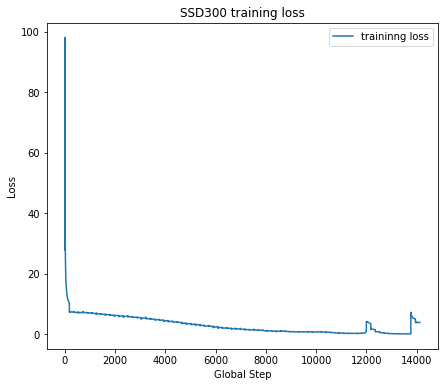

In [18]:
fig, axes = plt.subplots(figsize=(7,6))
plot(exp7, fig, axes)

# Prediction

In [28]:
for i_batch, sample_batched in enumerate(test_loader):
    if i_batch > 1:
        break
    print("Mini-Batch NO.:", i_batch)
    x,target = sample_batched
    x = x.to(device)
    loc, conf, prior = SSD300_model.forward(x)

Mini-Batch NO.: 0
Mini-Batch NO.: 1


In [29]:
import random
def plt_Predictions(img, label, figsize=(5,5), linewidth=1.5):
    """Visualize bounding boxes. Largely inspired by SSD-MXNET!
        """
    fig = plt.figure(figsize=figsize)
    plt.imshow(img)
    height = img.shape[0]
    width = img.shape[1]
    colors = dict()
    for i in range(label.shape[0]):
        cls_id = int(label[i][4])
        if cls_id >= 0:
            if cls_id not in colors:
                colors[cls_id] = (random.random(), random.random(), random.random())
            xmin = int(label[i][0] * height)
            ymin = int(label[i][1] * width)
            xmax = int(label[i][2] * height)
            ymax = int(label[i][3] * width)
            rect = plt.Rectangle((xmin, ymin), xmax - xmin,
                                 ymax - ymin, fill=False,
                                 edgecolor=colors[cls_id],
                                 linewidth=linewidth)
            plt.gca().add_patch(rect)
            class_name = VOC2012_CLASSES[cls_id]
            score = label[i][5]*100
            plt.gca().text(xmin, ymin - 2,'{:s}: {:.2f}%'.format(class_name,score),
                           bbox=dict(facecolor=colors[cls_id], alpha=0.5),
                           fontsize=12, color='white')
    plt.show()

Predictions:
label: pottedplant ||	 count: 1
score:
 tensor([[0.7970]])
bbox:
 tensor([[0.4234, 0.1757, 1.0000, 0.8605]])
----------------
Target:
label:
 tensor([12., 14.])
bbox:
 tensor([[0.1061, 0.0341, 0.9962, 0.9980],
        [0.6932, 0.4168, 0.9962, 0.5972]])


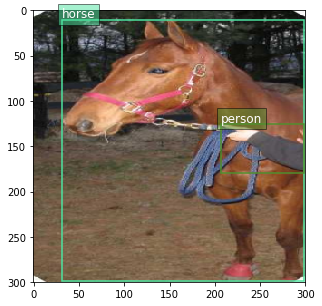

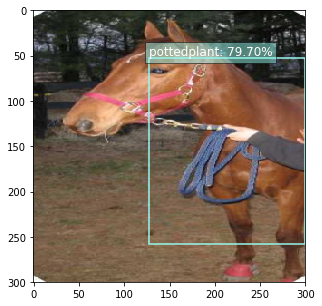

Predictions:
Target:
label:
 tensor([3.])
bbox:
 tensor([[0.0400, 0.1566, 0.8140, 0.7590]])


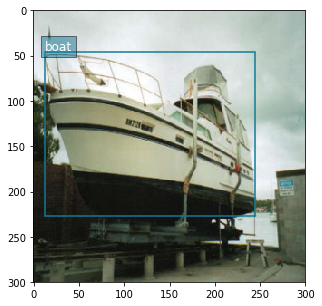

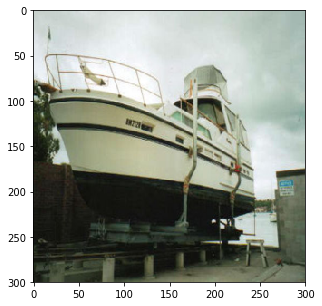

Predictions:
label: bird ||	 count: 2
score:
 tensor([[0.1257],
        [0.1218]])
bbox:
 tensor([[0.2457, 0.1934, 0.6543, 0.7393],
        [0.1296, 0.1947, 0.8478, 0.9654]])
----------------
label: boat ||	 count: 1
score:
 tensor([[0.9757]])
bbox:
 tensor([[0.0761, 0.1859, 0.8583, 1.0000]])
----------------
label: person ||	 count: 1
score:
 tensor([[0.3821]])
bbox:
 tensor([[0.1243, 0.1617, 0.7167, 0.9362]])
----------------
Target:
label:
 tensor([2.])
bbox:
 tensor([[0.2200, 0.1832, 0.5720, 0.5105]])


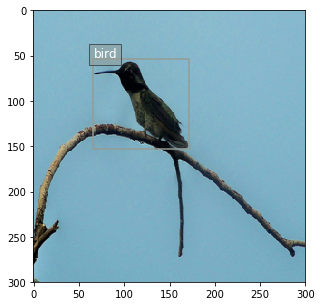

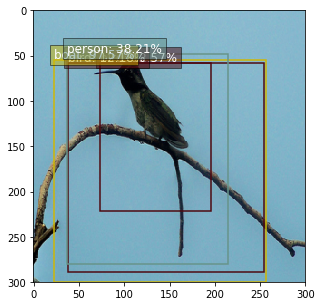

Predictions:
label: bicycle ||	 count: 1
score:
 tensor([[0.9661]])
bbox:
 tensor([[0.0643, 0.0381, 0.9942, 0.9278]])
----------------
label: bottle ||	 count: 1
score:
 tensor([[0.2523]])
bbox:
 tensor([[0.3022, 0.2162, 0.3762, 0.4447]])
----------------
label: motorbike ||	 count: 1
score:
 tensor([[0.3717]])
bbox:
 tensor([[0.1310, 0.0507, 0.9683, 0.9268]])
----------------
label: person ||	 count: 1
score:
 tensor([[0.4842]])
bbox:
 tensor([[0.2261, 0.2380, 0.4662, 0.5637]])
----------------
Target:
label:
 tensor([6., 1.])
bbox:
 tensor([[0.0000, 0.0000, 0.9980, 0.5729],
        [0.0380, 0.0769, 0.9980, 0.8780]])


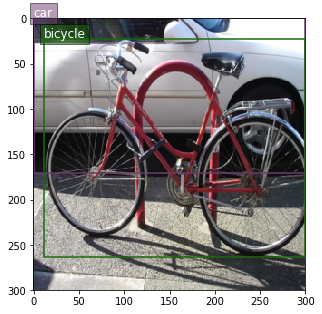

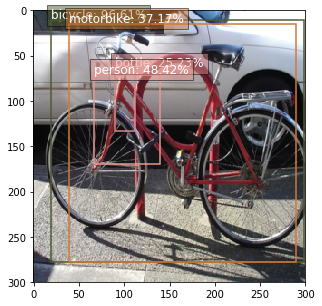

Predictions:
label: aeroplane ||	 count: 1
score:
 tensor([[0.2688]])
bbox:
 tensor([[0.0505, 0.1892, 0.9829, 0.8218]])
----------------
label: cow ||	 count: 1
score:
 tensor([[0.2110]])
bbox:
 tensor([[0.1924, 0.5917, 0.4471, 0.7591]])
----------------
Target:
label:
 tensor([2., 2.])
bbox:
 tensor([[0.3627, 0.1560, 0.7200, 0.3120],
        [0.1787, 0.6380, 0.4747, 0.7780]])


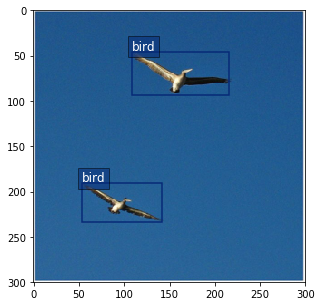

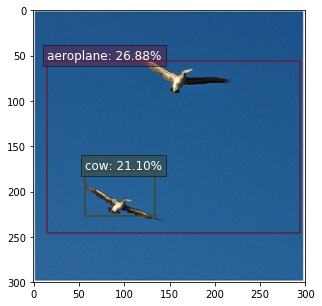

Predictions:
label: train ||	 count: 1
score:
 tensor([[0.6094]])
bbox:
 tensor([[0.0991, 0.1790, 0.8318, 0.9139]])
----------------
Target:
label:
 tensor([11., 14., 14., 14., 14., 14.])
bbox:
 tensor([[0.3380, 0.7446, 0.5680, 0.8584],
        [0.3680, 0.2489, 0.5040, 0.6760],
        [0.2340, 0.2940, 0.3740, 0.7403],
        [0.1900, 0.3369, 0.3320, 0.7854],
        [0.5840, 0.3155, 0.7160, 0.7854],
        [0.5180, 0.2468, 0.6800, 0.6674]])


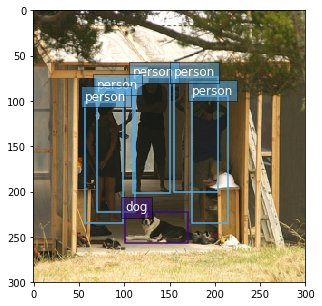

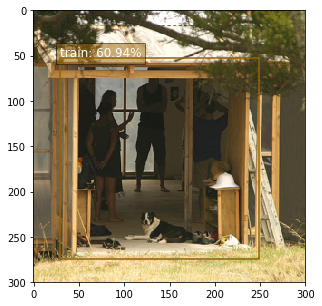

Predictions:
label: aeroplane ||	 count: 1
score:
 tensor([[0.9977]])
bbox:
 tensor([[0.0587, 0.1960, 0.9717, 0.8717]])
----------------
label: car ||	 count: 3
score:
 tensor([[0.2140],
        [0.1665],
        [0.1416]])
bbox:
 tensor([[0.5982, 0.7646, 0.9466, 0.9184],
        [0.6096, 0.7388, 0.6813, 0.7725],
        [0.5513, 0.7392, 0.6236, 0.7702]])
----------------
Target:
label:
 tensor([3., 3.])
bbox:
 tensor([[0.6400, 0.5080, 0.9973, 0.9320],
        [0.0000, 0.7940, 0.5867, 0.9400]])


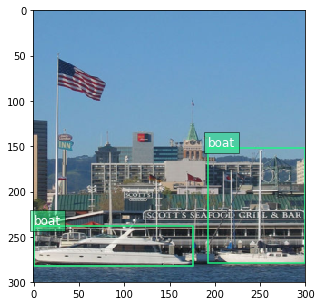

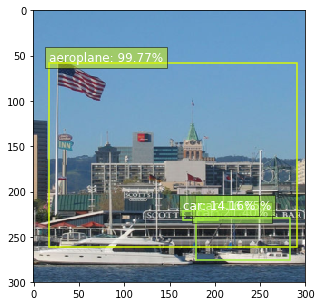

Predictions:
label: bottle ||	 count: 1
score:
 tensor([[0.2030]])
bbox:
 tensor([[0.0329, 0.7441, 0.0946, 0.9394]])
----------------
label: car ||	 count: 1
score:
 tensor([[0.8938]])
bbox:
 tensor([[0.4112, 0.7616, 0.5171, 0.8372]])
----------------
label: chair ||	 count: 3
score:
 tensor([[0.2576],
        [0.1439],
        [0.1380]])
bbox:
 tensor([[0.8669, 0.6154, 0.9338, 0.7276],
        [0.0000, 0.7482, 0.1271, 1.0000],
        [0.3323, 0.6848, 0.6326, 0.9493]])
----------------
Target:
label:
 tensor([19.,  4.])
bbox:
 tensor([[0.1800, 0.1450, 0.8960, 0.7400],
        [0.4000, 0.6200, 0.4920, 0.9350]])


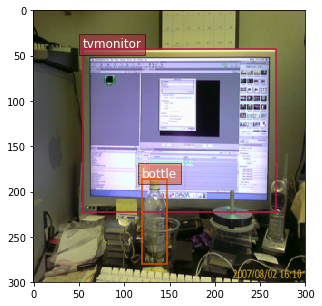

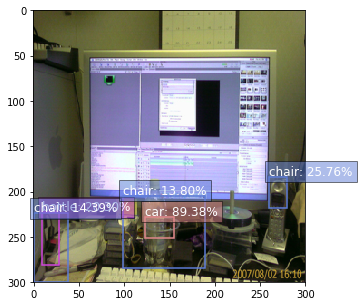

Predictions:
label: diningtable ||	 count: 1
score:
 tensor([[0.1265]])
bbox:
 tensor([[0.1245, 0.3311, 0.8922, 0.8022]])
----------------
label: person ||	 count: 1
score:
 tensor([[0.3468]])
bbox:
 tensor([[0.1682, 0.3034, 0.8296, 0.8083]])
----------------
label: sofa ||	 count: 1
score:
 tensor([[0.1005]])
bbox:
 tensor([[0.2232, 0.4069, 0.7529, 0.8132]])
----------------
Target:
label:
 tensor([17.,  8.])
bbox:
 tensor([[0.2500, 0.3669, 0.8120, 0.7031],
        [0.0000, 0.3277, 0.2280, 0.7395]])


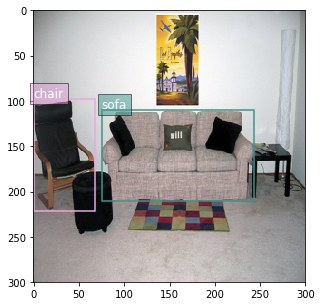

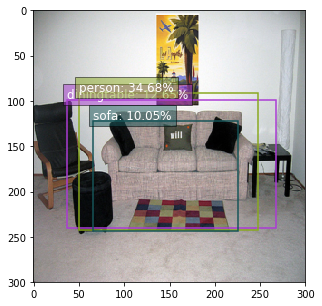

Predictions:
label: bicycle ||	 count: 1
score:
 tensor([[0.4900]])
bbox:
 tensor([[0.0040, 0.7397, 0.1260, 0.9890]])
----------------
label: bus ||	 count: 1
score:
 tensor([[0.1489]])
bbox:
 tensor([[0.2189, 0.1618, 0.7650, 0.4642]])
----------------
label: chair ||	 count: 1
score:
 tensor([[0.3781]])
bbox:
 tensor([[0.8729, 0.1263, 1.0000, 0.3204]])
----------------
Target:
label:
 tensor([6.])
bbox:
 tensor([[0.0000, 0.1111, 0.9980, 0.9970]])


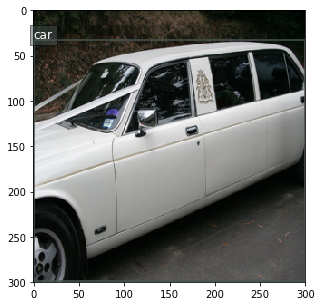

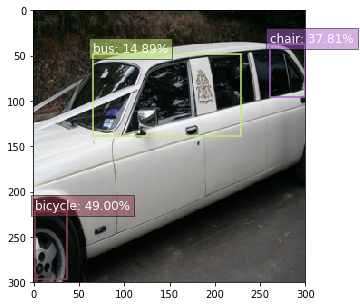

Predictions:
Target:
label:
 tensor([6., 6., 6., 6., 6., 6.])
bbox:
 tensor([[0.8740, 0.7040, 0.9980, 0.9253],
        [0.3580, 0.7200, 0.4900, 0.7840],
        [0.1740, 0.6987, 0.3220, 0.7813],
        [0.1240, 0.7147, 0.2440, 0.8133],
        [0.0000, 0.6800, 0.1340, 0.8213],
        [0.0000, 0.7307, 0.0780, 0.8400]])


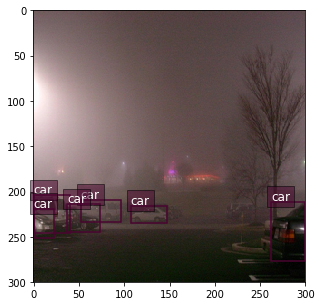

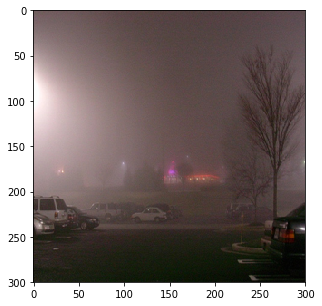

Predictions:
label: cat ||	 count: 1
score:
 tensor([[0.1247]])
bbox:
 tensor([[0.0612, 0.0000, 0.8332, 0.8948]])
----------------
label: dog ||	 count: 1
score:
 tensor([[0.9998]])
bbox:
 tensor([[0.0304, 0.0389, 0.8831, 0.9237]])
----------------
Target:
label:
 tensor([12.])
bbox:
 tensor([[0.0000, 0.0700, 0.8950, 0.9980]])


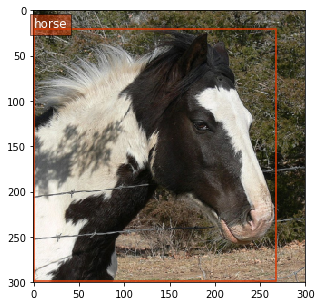

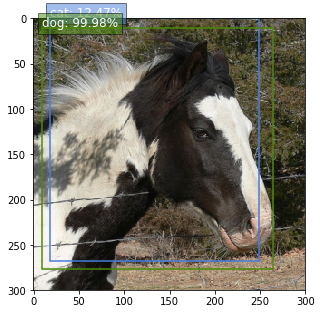

Predictions:
label: bottle ||	 count: 2
score:
 tensor([[0.9595],
        [0.9368]])
bbox:
 tensor([[0.6248, 0.0000, 1.0000, 0.9743],
        [0.5359, 0.0971, 0.8379, 0.9132]])
----------------
label: chair ||	 count: 1
score:
 tensor([[0.1070]])
bbox:
 tensor([[0.4918, 0.5865, 0.7190, 0.8622]])
----------------
label: dog ||	 count: 1
score:
 tensor([[0.2862]])
bbox:
 tensor([[0.5279, 0.6575, 0.8599, 0.9374]])
----------------
label: person ||	 count: 1
score:
 tensor([[0.2746]])
bbox:
 tensor([[0.5285, 0.6855, 0.8150, 0.9335]])
----------------
Target:
label:
 tensor([7.])
bbox:
 tensor([[0.5669, 0.6500, 0.8151, 0.8560]])


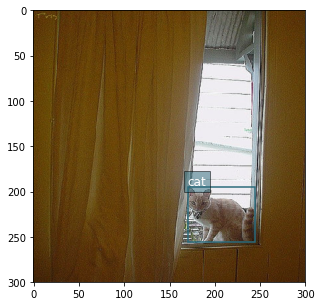

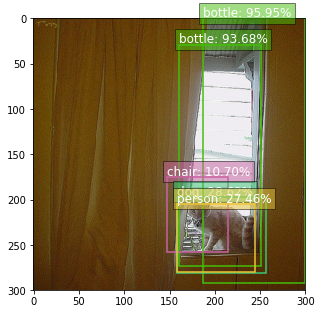

Predictions:
label: cat ||	 count: 1
score:
 tensor([[0.7250]])
bbox:
 tensor([[0.0170, 0.1028, 0.9364, 0.9371]])
----------------
label: dog ||	 count: 1
score:
 tensor([[0.7018]])
bbox:
 tensor([[0.0721, 0.1565, 0.8646, 0.9356]])
----------------
label: person ||	 count: 1
score:
 tensor([[0.1792]])
bbox:
 tensor([[0.0509, 0.1382, 0.9110, 0.9501]])
----------------
Target:
label:
 tensor([11.])
bbox:
 tensor([[0.0930, 0.0880, 0.9341, 0.9980]])


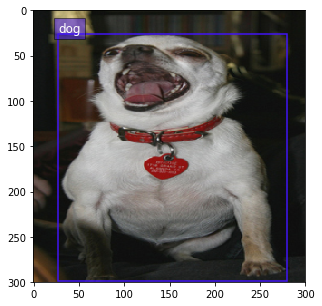

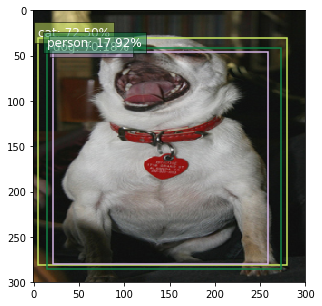

Predictions:
Target:
label:
 tensor([18.])
bbox:
 tensor([[0.0000, 0.3653, 0.5000, 0.4427]])


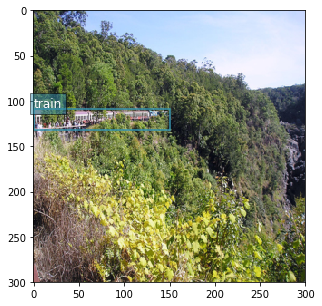

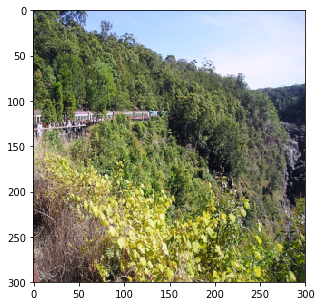

Predictions:
label: bicycle ||	 count: 1
score:
 tensor([[0.9446]])
bbox:
 tensor([[0.3877, 0.3800, 0.6082, 0.7168]])
----------------
label: bus ||	 count: 2
score:
 tensor([[0.3771],
        [0.2192]])
bbox:
 tensor([[0.0820, 0.1904, 0.3118, 0.4948],
        [0.1369, 0.2444, 0.3392, 0.4603]])
----------------
Target:
label:
 tensor([ 1., 14.])
bbox:
 tensor([[0.3820, 0.4853, 0.6180, 0.7360],
        [0.4500, 0.2800, 0.5420, 0.6427]])


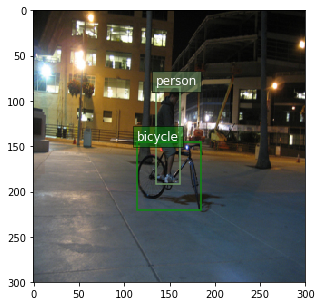

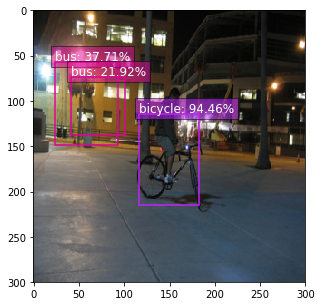

Predictions:
label: aeroplane ||	 count: 1
score:
 tensor([[0.2951]])
bbox:
 tensor([[0.0000, 0.2888, 0.9586, 0.8560]])
----------------
label: bird ||	 count: 1
score:
 tensor([[0.1508]])
bbox:
 tensor([[0.0712, 0.5445, 0.1787, 0.9142]])
----------------
label: car ||	 count: 1
score:
 tensor([[0.5293]])
bbox:
 tensor([[0.0000, 0.2888, 0.9586, 0.8560]])
----------------
label: person ||	 count: 3
score:
 tensor([[0.9966],
        [0.2047],
        [0.1649]])
bbox:
 tensor([[0.5089, 0.3132, 0.8616, 0.9010],
        [0.6484, 0.2997, 0.7922, 0.6255],
        [0.0810, 0.5331, 0.1721, 0.8945]])
----------------
Target:
label:
 tensor([14., 14., 14.,  3.,  3.])
bbox:
 tensor([[0.5060, 0.4294, 0.6260, 0.8859],
        [0.6160, 0.2943, 0.8840, 0.8979],
        [0.0300, 0.5165, 0.2020, 0.9129],
        [0.4700, 0.6156, 0.6760, 0.8438],
        [0.1940, 0.7027, 0.3980, 0.9039]])


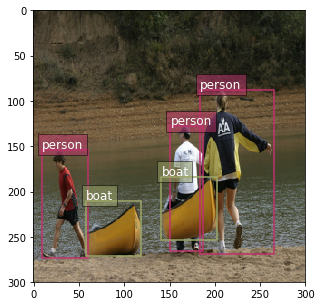

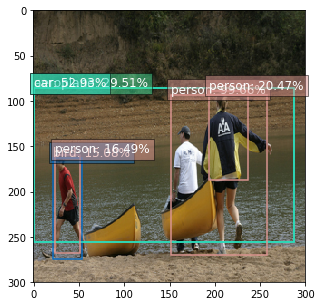

Predictions:
label: chair ||	 count: 1
score:
 tensor([[0.2557]])
bbox:
 tensor([[0.2764, 0.3687, 0.3992, 0.5670]])
----------------
label: person ||	 count: 1
score:
 tensor([[0.5278]])
bbox:
 tensor([[0.6412, 0.3087, 0.7783, 0.6188]])
----------------
label: train ||	 count: 1
score:
 tensor([[0.1259]])
bbox:
 tensor([[0.0061, 0.2711, 0.3753, 0.6400]])
----------------
Target:
label:
 tensor([14., 14., 13.,  6.])
bbox:
 tensor([[0.2260, 0.2025, 0.2920, 0.2725],
        [0.6240, 0.2900, 0.7500, 0.6175],
        [0.7060, 0.3875, 0.8200, 0.6500],
        [0.1600, 0.2675, 0.4900, 0.6425]])


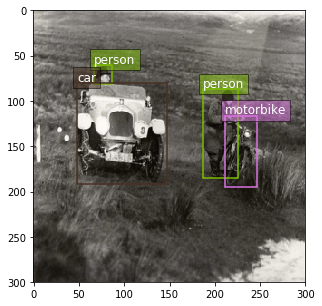

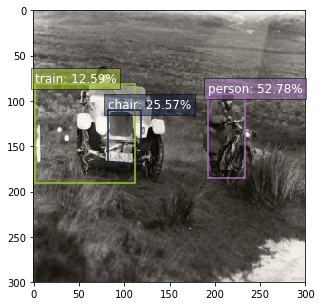

Predictions:
label: train ||	 count: 1
score:
 tensor([[0.9839]])
bbox:
 tensor([[0.1885, 0.0747, 0.8295, 0.7755]])
----------------
Target:
label:
 tensor([14., 14.])
bbox:
 tensor([[0.4257, 0.4691, 0.4950, 0.5721],
        [0.4323, 0.4943, 0.5380, 0.6682]])


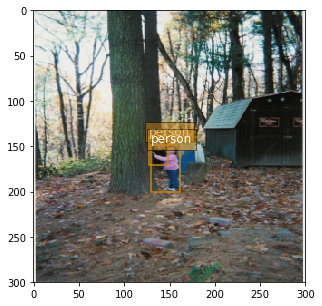

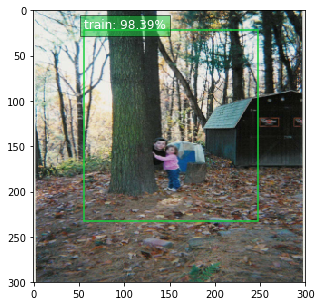

Predictions:
label: cat ||	 count: 1
score:
 tensor([[0.1008]])
bbox:
 tensor([[0.0662, 0.0788, 0.9018, 0.9841]])
----------------
label: chair ||	 count: 1
score:
 tensor([[0.6911]])
bbox:
 tensor([[0.0893, 0.0355, 0.8819, 0.9993]])
----------------
label: dog ||	 count: 1
score:
 tensor([[0.8373]])
bbox:
 tensor([[0.0000, 0.0000, 0.7078, 0.8408]])
----------------
label: person ||	 count: 1
score:
 tensor([[0.9937]])
bbox:
 tensor([[0.0908, 0.0351, 0.8622, 0.9921]])
----------------
Target:
label:
 tensor([14.])
bbox:
 tensor([[0.1880, 0.0691, 0.8260, 0.9970]])


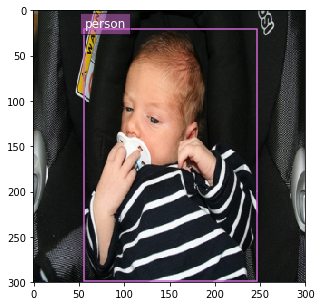

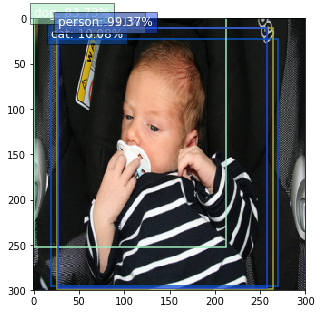

Predictions:
label: person ||	 count: 6
score:
 tensor([[0.9991],
        [0.9314],
        [0.8134],
        [0.6481],
        [0.3482],
        [0.2123]])
bbox:
 tensor([[0.5933, 0.1925, 0.9589, 0.9567],
        [0.0670, 0.3891, 0.5245, 0.9971],
        [0.0148, 0.4441, 0.3494, 1.0000],
        [0.2729, 0.3886, 0.4959, 0.9885],
        [0.3543, 0.3496, 0.6996, 1.0000],
        [0.0103, 0.4930, 0.0605, 0.6416]])
----------------
Target:
label:
 tensor([14., 14., 14.])
bbox:
 tensor([[0.0000, 0.3893, 0.3220, 0.9973],
        [0.2960, 0.3147, 0.6360, 0.9973],
        [0.6300, 0.3733, 0.9980, 0.9973]])


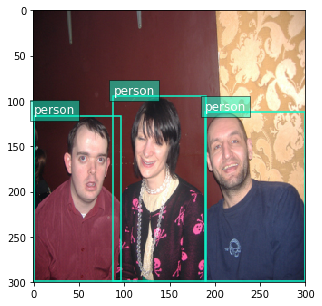

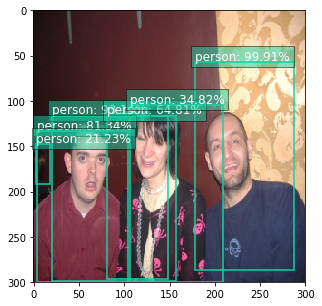

Predictions:
label: bird ||	 count: 1
score:
 tensor([[0.7948]])
bbox:
 tensor([[0.1253, 0.2174, 0.9599, 0.8276]])
----------------
label: cow ||	 count: 2
score:
 tensor([[0.8778],
        [0.2775]])
bbox:
 tensor([[0.7579, 0.4108, 0.9103, 0.5543],
        [0.2085, 0.3980, 0.4237, 0.5964]])
----------------
label: dog ||	 count: 1
score:
 tensor([[0.8441]])
bbox:
 tensor([[0.2015, 0.3971, 0.4514, 0.6185]])
----------------
label: sheep ||	 count: 1
score:
 tensor([[0.6560]])
bbox:
 tensor([[0.2085, 0.3980, 0.4237, 0.5964]])
----------------
Target:
label:
 tensor([12., 12.])
bbox:
 tensor([[0.1740, 0.3893, 0.4500, 0.6507],
        [0.7600, 0.4053, 0.9280, 0.6400]])


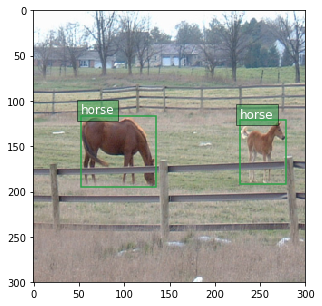

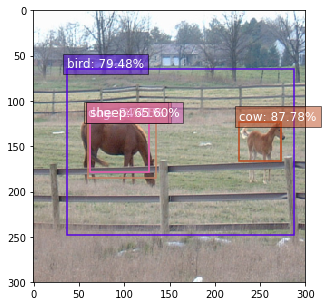

Predictions:
label: cat ||	 count: 2
score:
 tensor([[0.5819],
        [0.1826]])
bbox:
 tensor([[0.3671, 0.3533, 0.9574, 0.9978],
        [0.0468, 0.0134, 0.9172, 0.9740]])
----------------
label: dog ||	 count: 2
score:
 tensor([[0.9086],
        [0.2163]])
bbox:
 tensor([[0.0000, 0.0174, 0.5515, 0.9466],
        [0.1039, 0.0022, 0.9350, 0.9683]])
----------------
label: person ||	 count: 1
score:
 tensor([[0.5005]])
bbox:
 tensor([[0.1039, 0.0022, 0.9350, 0.9683]])
----------------
label: sofa ||	 count: 1
score:
 tensor([[0.8373]])
bbox:
 tensor([[0.0436, 0.0095, 0.9190, 0.9853]])
----------------
Target:
label:
 tensor([14.,  7.])
bbox:
 tensor([[0.0000, 0.0194, 0.9980, 0.9972],
        [0.0560, 0.2472, 0.9980, 0.9972]])


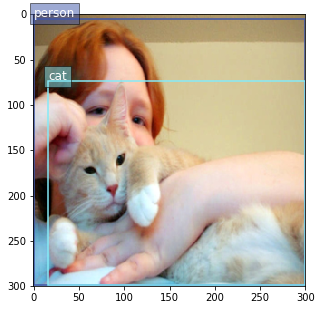

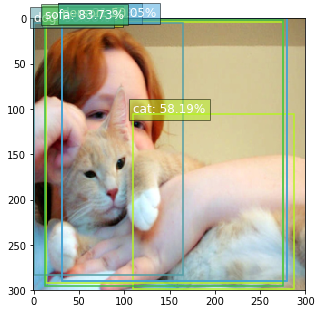

Predictions:
label: car ||	 count: 1
score:
 tensor([[0.9554]])
bbox:
 tensor([[0.2433, 0.0403, 0.9912, 1.0000]])
----------------
label: person ||	 count: 2
score:
 tensor([[0.2548],
        [0.1168]])
bbox:
 tensor([[0.2697, 0.0257, 0.9406, 0.9922],
        [0.4831, 0.2669, 0.6018, 0.6039]])
----------------
label: pottedplant ||	 count: 1
score:
 tensor([[0.1708]])
bbox:
 tensor([[0.4943, 0.1491, 0.9137, 0.9845]])
----------------
Target:
label:
 tensor([14.])
bbox:
 tensor([[0.4560, 0.3072, 0.6340, 0.9718]])


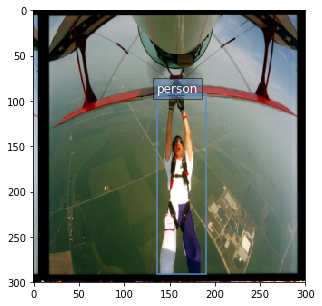

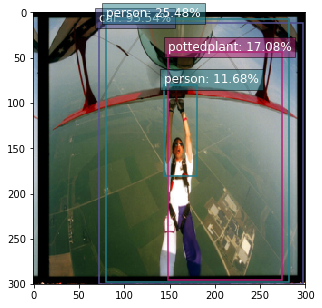

Predictions:
label: bird ||	 count: 1
score:
 tensor([[0.3040]])
bbox:
 tensor([[0.4743, 0.2837, 0.7434, 0.9128]])
----------------
label: person ||	 count: 2
score:
 tensor([[0.6056],
        [0.3205]])
bbox:
 tensor([[0.5702, 0.1053, 0.9594, 0.9882],
        [0.4848, 0.2212, 0.8755, 0.8602]])
----------------
label: sofa ||	 count: 2
score:
 tensor([[0.9967],
        [0.2709]])
bbox:
 tensor([[0.0632, 0.0918, 0.9456, 1.0000],
        [0.5702, 0.1053, 0.9594, 0.9882]])
----------------
Target:
label:
 tensor([14.])
bbox:
 tensor([[0.5033, 0.2443, 0.9826, 0.9967]])


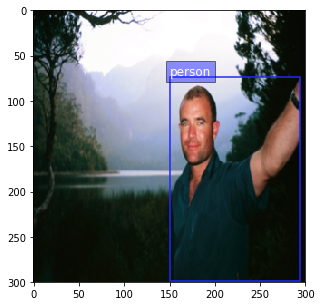

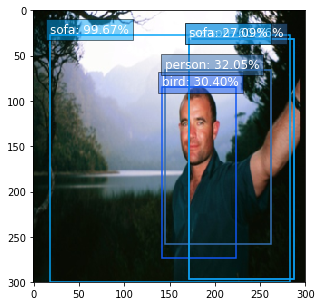

Predictions:
label: person ||	 count: 2
score:
 tensor([[1.0000],
        [0.9991]])
bbox:
 tensor([[0.2130, 0.1562, 0.7807, 0.9871],
        [0.5916, 0.0662, 1.0000, 0.9754]])
----------------
Target:
label:
 tensor([14., 14., 14.])
bbox:
 tensor([[0.1600, 0.1840, 0.6340, 0.9973],
        [0.4180, 0.3360, 0.8700, 0.9973],
        [0.7460, 0.0053, 0.9980, 0.9973]])


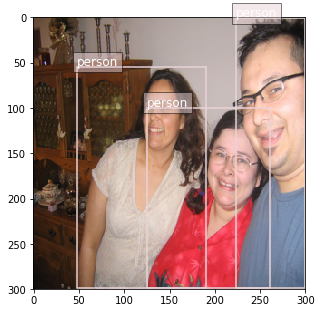

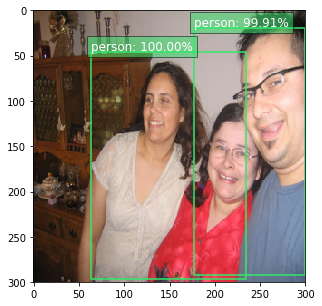

Predictions:
label: cat ||	 count: 1
score:
 tensor([[0.1750]])
bbox:
 tensor([[0.2144, 0.3625, 0.6066, 0.9412]])
----------------
label: dog ||	 count: 1
score:
 tensor([[0.8502]])
bbox:
 tensor([[0.2051, 0.3468, 0.5898, 0.9375]])
----------------
Target:
label:
 tensor([11.])
bbox:
 tensor([[0.2380, 0.3754, 0.5840, 0.9219]])


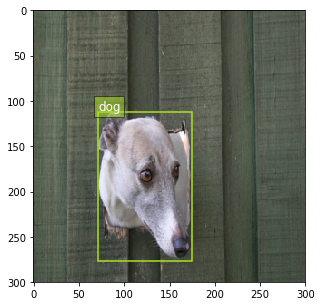

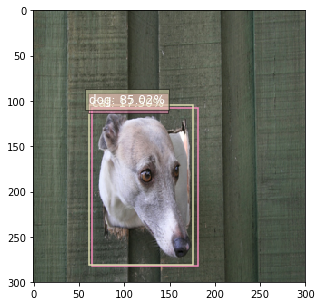

Predictions:
label: chair ||	 count: 1
score:
 tensor([[0.1291]])
bbox:
 tensor([[0.6139, 0.5726, 0.9055, 1.0000]])
----------------
label: person ||	 count: 5
score:
 tensor([[0.9984],
        [0.7470],
        [0.6008],
        [0.2458],
        [0.2224]])
bbox:
 tensor([[0.1181, 0.0242, 0.8160, 0.9957],
        [0.0729, 0.0250, 0.4962, 1.0000],
        [0.5272, 0.3687, 0.8118, 0.9281],
        [0.3039, 0.7534, 0.3575, 1.0000],
        [0.3278, 0.2664, 0.8231, 0.9644]])
----------------
Target:
label:
 tensor([14., 14.])
bbox:
 tensor([[0.0000, 0.0000, 0.3140, 0.9970],
        [0.4300, 0.3413, 0.8880, 0.9970]])


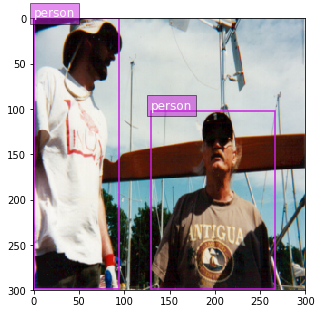

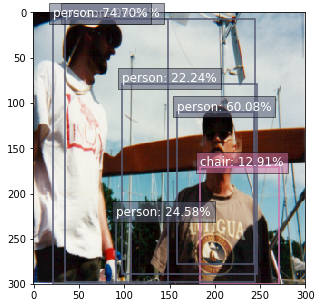

Predictions:
label: bottle ||	 count: 1
score:
 tensor([[0.1698]])
bbox:
 tensor([[0.0976, 0.0172, 0.8780, 0.9483]])
----------------
label: tvmonitor ||	 count: 2
score:
 tensor([[0.9898],
        [0.1870]])
bbox:
 tensor([[0.1009, 0.0222, 0.8756, 0.9176],
        [0.1276, 0.3665, 0.6700, 0.8211]])
----------------
Target:
label:
 tensor([19.])
bbox:
 tensor([[0.1080, 0.0000, 0.9120, 0.9973]])


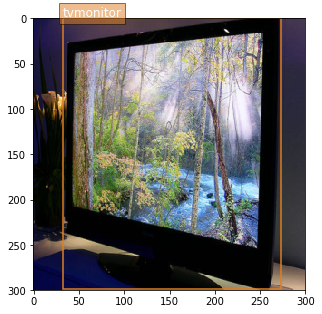

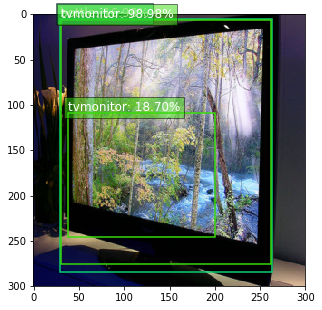

Predictions:
label: person ||	 count: 3
score:
 tensor([[0.9967],
        [0.7550],
        [0.1790]])
bbox:
 tensor([[0.0333, 0.0000, 0.5191, 0.9573],
        [0.5136, 0.1103, 0.9589, 0.9048],
        [0.1194, 0.1260, 0.9121, 0.8826]])
----------------
label: pottedplant ||	 count: 1
score:
 tensor([[0.5396]])
bbox:
 tensor([[0.6547, 0.3722, 0.7143, 0.4626]])
----------------
Target:
label:
 tensor([14.,  8.])
bbox:
 tensor([[0.0040, 0.0533, 0.6180, 0.9973],
        [0.7020, 0.0000, 0.9980, 0.6187]])


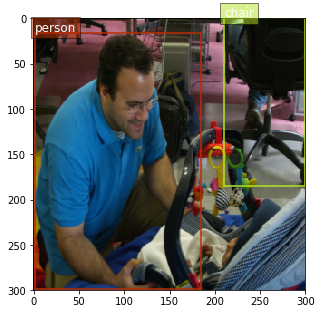

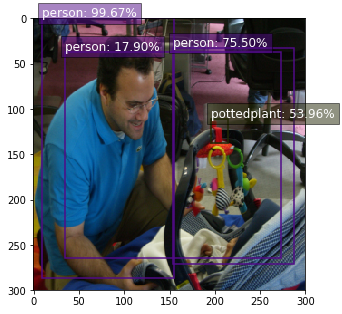

Predictions:
label: aeroplane ||	 count: 1
score:
 tensor([[0.9951]])
bbox:
 tensor([[0.0000, 0.0579, 0.9294, 0.9482]])
----------------
Target:
label:
 tensor([0., 0., 0., 6.])
bbox:
 tensor([[0.0460, 0.0387, 0.8180, 0.7262],
        [0.4240, 0.1548, 0.9980, 0.5060],
        [0.1740, 0.2738, 0.4380, 0.4911],
        [0.0000, 0.7232, 0.1860, 0.9196]])


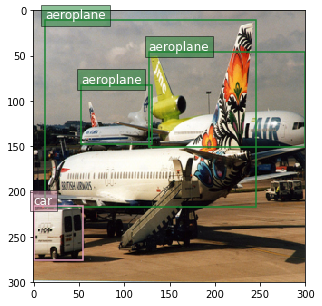

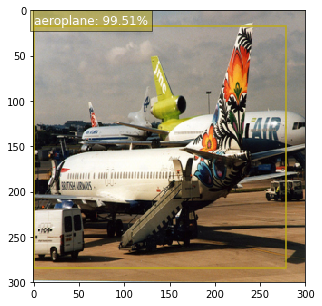

Predictions:
label: aeroplane ||	 count: 1
score:
 tensor([[0.6603]])
bbox:
 tensor([[0.6242, 0.2876, 0.7353, 0.3649]])
----------------
label: boat ||	 count: 1
score:
 tensor([[0.8852]])
bbox:
 tensor([[0.1611, 0.2155, 0.9650, 0.7680]])
----------------
label: bus ||	 count: 1
score:
 tensor([[0.2327]])
bbox:
 tensor([[0.6901, 0.5485, 0.8900, 0.7183]])
----------------
label: person ||	 count: 2
score:
 tensor([[0.5779],
        [0.5356]])
bbox:
 tensor([[0.8707, 0.5340, 0.9193, 0.7194],
        [0.8173, 0.3544, 0.8621, 0.5267]])
----------------
label: train ||	 count: 1
score:
 tensor([[0.3633]])
bbox:
 tensor([[0.2207, 0.2709, 0.9279, 0.7457]])
----------------
Target:
label:
 tensor([6.])
bbox:
 tensor([[0.7515, 0.6940, 0.9438, 0.7640]])


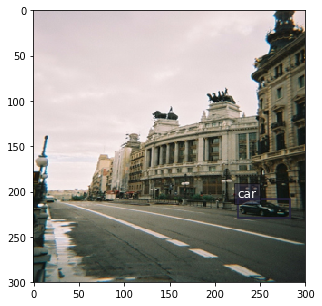

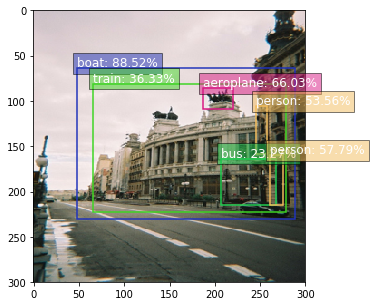

In [30]:
for i in range(batch_size):
    print("Predictions:")
    predict = torch.zeros(1,6)
    loc, conf, prior = SSD300_model(x[i].view(1,3,300,300))
    prior = prior.to(device)
    softmax = F.softmax(conf.data[0],1)
    # decode loc to (x_min, y_min, x_max, y_max)
    decode_loc = decode(loc[0], prior, SSD300_model.MultiBoxLoss.variance).view(1,-1,4)
    for idx in range(1,21):
        thresh = 0.1
        dets = softmax[:,idx]
        mask_score = dets.gt(thresh).t()
        mask_bbox = dets.gt(thresh).expand(4, dets.size(0)).t()
        score = torch.masked_select(dets, mask_score).view(-1)
        bbox = torch.masked_select(decode_loc.data, mask_bbox).view(-1, 4)
        if bbox.shape[0]!=0:
            keep, count = nms(bbox, score, overlap=0.5, top_k=200)
            class_scores = score[keep[:count]].view(-1,1).to('cpu')
            class_boxes = torch.clamp(bbox[keep[:count]],0,1).to('cpu')
            print("label:",VOC2012_CLASSES[idx-1], "||\t count:",count)
            print('score:\n',class_scores)
            print('bbox:\n',class_boxes)
            print('----------------')
            tmp = torch.ones(count,1)*(idx-1)
#             class_boxes = bbox[keep[:count]].to('cpu')
            tmp = torch.cat((tmp, class_scores), 1)
            tmp = torch.cat((class_boxes, tmp), 1)
            predict = torch.cat((predict, tmp), 0)
    img = x[i].to('cpu').numpy()
    img = np.moveaxis(img, [0, 1, 2], [2, 0, 1])
    print("Target:")
    print("label:\n",target[i][:,-1])
    print("bbox:\n",target[i][:,:4])
    plt_GroundTruth(img, target[i])
    plt_Predictions(img, predict[1:])
#     print(predict)

# Evaluation

In [23]:
from collections import defaultdict
import itertools
import numpy as np
import six

def bbox_iou(bbox_a, bbox_b):
    """Calculate the Intersection of Unions (IoUs) between bounding boxes.
    IoU is calculated as a ratio of area of the intersection
    and area of the union.
    This function accepts both :ob
    j:`numpy.ndarray` and :obj:`cupy.ndarray` as
    inputs. Please note that both :obj:`bbox_a` and :obj:`bbox_b` need to be
    same type.
    The output is same type as the type of the inputs.
    Args:
        bbox_a (array): An array whose shape is :math:`(N, 4)`.
            :math:`N` is the number of bounding boxes.
            The dtype should be :obj:`numpy.float32`.
        bbox_b (array): An array similar to :obj:`bbox_a`,
            whose shape is :math:`(K, 4)`.
            The dtype should be :obj:`numpy.float32`.
    Returns:
        array:
        An array whose shape is :math:`(N, K)`. \
        An element at index :math:`(n, k)` contains IoUs between \
        :math:`n` th bounding box in :obj:`bbox_a` and :math:`k` th bounding \
        box in :obj:`bbox_b`.
    """
    if bbox_a.shape[1] != 4 or bbox_b.shape[1] != 4:
        raise IndexError

    # top left
    tl = np.maximum(bbox_a[:, None, :2], bbox_b[:, :2])
    # bottom right
    br = np.minimum(bbox_a[:, None, 2:], bbox_b[:, 2:])

    area_i = np.prod(br - tl, axis=2) * (tl < br).all(axis=2)
    area_a = np.prod(bbox_a[:, 2:] - bbox_a[:, :2], axis=1)
    area_b = np.prod(bbox_b[:, 2:] - bbox_b[:, :2], axis=1)
    return area_i / (area_a[:, None] + area_b - area_i)


def calc_detection_voc_prec_rec(
        pred_bboxes, pred_labels, pred_scores, gt_bboxes, gt_labels,
        gt_difficults=None,
        iou_thresh=0.5):
    """Calculate precision and recall based on evaluation code of PASCAL VOC.
    This function calculates precision and recall of
    predicted bounding boxes obtained from a dataset which has :math:`N`
    images.
    The code is based on the evaluation code used in PASCAL VOC Challenge.
    Args:
        pred_bboxes (iterable of numpy.ndarray): An iterable of :math:`N`
            sets of bounding boxes.
            Its index corresponds to an index for the base dataset.
            Each element of :obj:`pred_bboxes` is a set of coordinates
            of bounding boxes. This is an array whose shape is :math:`(R, 4)`,
            where :math:`R` corresponds
            to the number of bounding boxes, which may vary among boxes.
            The second axis corresponds to
            :math:`y_{min}, x_{min}, y_{max}, x_{max}` of a bounding box.
        pred_labels (iterable of numpy.ndarray): An iterable of labels.
            Similar to :obj:`pred_bboxes`, its index corresponds to an
            index for the base dataset. Its length is :math:`N`.
        pred_scores (iterable of numpy.ndarray): An iterable of confidence
            scores for predicted bounding boxes. Similar to :obj:`pred_bboxes`,
            its index corresponds to an index for the base dataset.
            Its length is :math:`N`.
        gt_bboxes (iterable of numpy.ndarray): An iterable of ground truth
            bounding boxes
            whose length is :math:`N`. An element of :obj:`gt_bboxes` is a
            bounding box whose shape is :math:`(R, 4)`. Note that the number of
            bounding boxes in each image does not need to be same as the number
            of corresponding predicted boxes.
        gt_labels (iterable of numpy.ndarray): An iterable of ground truth
            labels which are organized similarly to :obj:`gt_bboxes`.
        gt_difficults (iterable of numpy.ndarray): An iterable of boolean
            arrays which is organized similarly to :obj:`gt_bboxes`.
            This tells whether the
            corresponding ground truth bounding box is difficult or not.
            By default, this is :obj:`None`. In that case, this function
            considers all bounding boxes to be not difficult.
        iou_thresh (float): A prediction is correct if its Intersection over
            Union with the ground truth is above this value..
    Returns:
        tuple of two lists:
        This function returns two lists: :obj:`prec` and :obj:`rec`.
        * :obj:`prec`: A list of arrays. :obj:`prec[l]` is precision \
            for class :math:`l`. If class :math:`l` does not exist in \
            either :obj:`pred_labels` or :obj:`gt_labels`, :obj:`prec[l]` is \
            set to :obj:`None`.
        * :obj:`rec`: A list of arrays. :obj:`rec[l]` is recall \
            for class :math:`l`. If class :math:`l` that is not marked as \
            difficult does not exist in \
            :obj:`gt_labels`, :obj:`rec[l]` is \
            set to :obj:`None`.
    """

    pred_bboxes = iter(pred_bboxes)
    pred_labels = iter(pred_labels)
    pred_scores = iter(pred_scores)
    gt_bboxes = iter(gt_bboxes)
    gt_labels = iter(gt_labels)
    if gt_difficults is None:
        gt_difficults = itertools.repeat(None)
    else:
        gt_difficults = iter(gt_difficults)

    n_pos = defaultdict(int)
    score = defaultdict(list)
    match = defaultdict(list)

    for pred_bbox, pred_label, pred_score, gt_bbox, gt_label, gt_difficult in \
            six.moves.zip(
                pred_bboxes, pred_labels, pred_scores,
                gt_bboxes, gt_labels, gt_difficults):

        if gt_difficult is None:
            gt_difficult = np.zeros(gt_bbox.shape[0], dtype=bool)

        for l in np.unique(np.concatenate((pred_label, gt_label)).astype(int)):
            pred_mask_l = pred_label == l
            pred_bbox_l = pred_bbox[pred_mask_l]
            pred_score_l = pred_score[pred_mask_l]
            # sort by score
            order = pred_score_l.argsort()[::-1]
            pred_bbox_l = pred_bbox_l[order]
            pred_score_l = pred_score_l[order]

            gt_mask_l = gt_label == l
            gt_bbox_l = gt_bbox[gt_mask_l]
            gt_difficult_l = gt_difficult[gt_mask_l]

            n_pos[l] += np.logical_not(gt_difficult_l).sum()
            score[l].extend(pred_score_l)

            if len(pred_bbox_l) == 0:
                continue
            if len(gt_bbox_l) == 0:
                match[l].extend((0,) * pred_bbox_l.shape[0])
                continue

            # VOC evaluation follows integer typed bounding boxes.
            pred_bbox_l = pred_bbox_l.copy()
            pred_bbox_l[:, 2:] += 1
            gt_bbox_l = gt_bbox_l.copy()
            gt_bbox_l[:, 2:] += 1

            iou = bbox_iou(pred_bbox_l, gt_bbox_l)
            gt_index = iou.argmax(axis=1)
            # set -1 if there is no matching ground truth
            gt_index[iou.max(axis=1) < iou_thresh] = -1
            del iou

            selec = np.zeros(gt_bbox_l.shape[0], dtype=bool)
            for gt_idx in gt_index:
                if gt_idx >= 0:
                    if gt_difficult_l[gt_idx]:
                        match[l].append(-1)
                    else:
                        if not selec[gt_idx]:
                            match[l].append(1)
                        else:
                            match[l].append(0)
                    selec[gt_idx] = True
                else:
                    match[l].append(0)

    for iter_ in (
            pred_bboxes, pred_labels, pred_scores,
            gt_bboxes, gt_labels, gt_difficults):
        if next(iter_, None) is not None:
            raise ValueError('Length of input iterables need to be same.')

    n_fg_class = max(n_pos.keys()) + 1
    prec = [None] * n_fg_class
    rec = [None] * n_fg_class

    for l in n_pos.keys():
        score_l = np.array(score[l])
        match_l = np.array(match[l], dtype=np.int8)

        order = score_l.argsort()[::-1]
        match_l = match_l[order]

        tp = np.cumsum(match_l == 1)
        fp = np.cumsum(match_l == 0)

        # If an element of fp + tp is 0,
        # the corresponding element of prec[l] is nan.
        prec[l] = tp / (fp + tp)
        # If n_pos[l] is 0, rec[l] is None.
        if n_pos[l] > 0:
            rec[l] = tp / n_pos[l]

    return prec, rec


def calc_detection_voc_ap(prec, rec, use_07_metric=False):
    """Calculate average precisions based on evaluation code of PASCAL VOC.
    This function calculates average precisions
    from given precisions and recalls.
    The code is based on the evaluation code used in PASCAL VOC Challenge.
    Args:
        prec (list of numpy.array): A list of arrays.
            :obj:`prec[l]` indicates precision for class :math:`l`.
            If :obj:`prec[l]` is :obj:`None`, this function returns
            :obj:`numpy.nan` for class :math:`l`.
        rec (list of numpy.array): A list of arrays.
            :obj:`rec[l]` indicates recall for class :math:`l`.
            If :obj:`rec[l]` is :obj:`None`, this function returns
            :obj:`numpy.nan` for class :math:`l`.
        use_07_metric (bool): Whether to use PASCAL VOC 2007 evaluation metric
            for calculating average precision. The default value is
            :obj:`False`.
    Returns:
        ~numpy.ndarray:
        This function returns an array of average precisions.
        The :math:`l`-th value corresponds to the average precision
        for class :math:`l`. If :obj:`prec[l]` or :obj:`rec[l]` is
        :obj:`None`, the corresponding value is set to :obj:`numpy.nan`.
    """

    n_fg_class = len(prec)
    ap = np.empty(n_fg_class)
    for l in six.moves.range(n_fg_class):
        if prec[l] is None or rec[l] is None:
            ap[l] = np.nan
            continue

        if use_07_metric:
            # 11 point metric
            ap[l] = 0
            for t in np.arange(0., 1.1, 0.1):
                if np.sum(rec[l] >= t) == 0:
                    p = 0
                else:
                    p = np.max(np.nan_to_num(prec[l])[rec[l] >= t])
                ap[l] += p / 11
        else:
            # correct AP calculation
            # first append sentinel values at the end
            mpre = np.concatenate(([0], np.nan_to_num(prec[l]), [0]))
            mrec = np.concatenate(([0], rec[l], [1]))

            mpre = np.maximum.accumulate(mpre[::-1])[::-1]

            # to calculate area under PR curve, look for points
            # where X axis (recall) changes value
            i = np.where(mrec[1:] != mrec[:-1])[0]

            # and sum (\Delta recall) * prec
            ap[l] = np.sum((mrec[i + 1] - mrec[i]) * mpre[i + 1])

    return ap

## training set

In [24]:
pred_bboxes = []
pred_labels = []
pred_scores = []
gt_bboxes = []
gt_labels = []
SSD300_model.eval()
for i_batch, sample_batched in enumerate(train_loader):
    print("Mini-Batch NO.:", i_batch)
    x,target = sample_batched
    x = x.to(device)
    LOC, CONF, prior = SSD300_model.forward(x)
    prior = prior.to(device)
    for i in range(LOC.shape[0]):
        predict = torch.zeros(1,6)
        loc, conf= LOC[i], CONF[i]
        softmax = F.softmax(conf.data,1)
        # decode loc to (x_min, y_min, x_max, y_max)
        decode_loc = decode(loc, prior, SSD300_model.MultiBoxLoss.variance).view(1,-1,4)
        for idx in range(1,21):
            thresh = 0.9
            dets = softmax[:,idx]
            mask_score = dets.gt(thresh).t()
            mask_bbox = dets.gt(thresh).expand(4, dets.size(0)).t()
            score = torch.masked_select(dets, mask_score).view(-1)
            bbox = torch.masked_select(decode_loc.data, mask_bbox).view(-1, 4)
            if bbox.shape[0]!=0:
                keep, count = nms(bbox, score, overlap=0.5, top_k=200)
                class_scores = score[keep[:count]].view(-1,1).to('cpu')
                class_boxes = torch.clamp(bbox[keep[:count]],0,1).to('cpu')
                tmp = torch.ones(count,1)*(idx-1)
                tmp = torch.cat((tmp, class_scores), 1)
                tmp = torch.cat((class_boxes, tmp), 1)
                predict = torch.cat((predict, tmp), 0)
        predict = predict[1:]
        pred_bboxes.append(predict[:,:-2].numpy())
        pred_labels.append(predict[:,-2].numpy())
        pred_scores.append(predict[:,-1].numpy())
        gt_bboxes.append(target[i][:,:4].numpy())
        gt_labels.append(target[i][:,-1].numpy())

Mini-Batch NO.: 0
Mini-Batch NO.: 1
Mini-Batch NO.: 2
Mini-Batch NO.: 3
Mini-Batch NO.: 4
Mini-Batch NO.: 5
Mini-Batch NO.: 6
Mini-Batch NO.: 7
Mini-Batch NO.: 8
Mini-Batch NO.: 9
Mini-Batch NO.: 10
Mini-Batch NO.: 11
Mini-Batch NO.: 12
Mini-Batch NO.: 13
Mini-Batch NO.: 14
Mini-Batch NO.: 15
Mini-Batch NO.: 16
Mini-Batch NO.: 17
Mini-Batch NO.: 18
Mini-Batch NO.: 19
Mini-Batch NO.: 20
Mini-Batch NO.: 21
Mini-Batch NO.: 22
Mini-Batch NO.: 23
Mini-Batch NO.: 24
Mini-Batch NO.: 25
Mini-Batch NO.: 26
Mini-Batch NO.: 27
Mini-Batch NO.: 28
Mini-Batch NO.: 29
Mini-Batch NO.: 30
Mini-Batch NO.: 31
Mini-Batch NO.: 32
Mini-Batch NO.: 33
Mini-Batch NO.: 34
Mini-Batch NO.: 35
Mini-Batch NO.: 36
Mini-Batch NO.: 37
Mini-Batch NO.: 38
Mini-Batch NO.: 39
Mini-Batch NO.: 40
Mini-Batch NO.: 41
Mini-Batch NO.: 42
Mini-Batch NO.: 43
Mini-Batch NO.: 44
Mini-Batch NO.: 45
Mini-Batch NO.: 46
Mini-Batch NO.: 47
Mini-Batch NO.: 48
Mini-Batch NO.: 49
Mini-Batch NO.: 50
Mini-Batch NO.: 51
Mini-Batch NO.: 52
Min

In [ ]:
prec,rec = calc_detection_voc_prec_rec(pred_bboxes, pred_labels, pred_scores, gt_bboxes, gt_labels)
mAP_matrix = calc_detection_voc_ap(prec,rec)
mAP = mAP_matrix.mean()
print("mAP Matrix:")
print(mAP_matrix)
print("mAP = ",mAP)

mAP Matrix:
[0.91019469 0.84114809 0.88723437 0.67804573 0.37342244 0.91621779
 0.73382705 0.97321562 0.80776674 0.84021185 0.9088941  0.96271324
 0.92898749 0.95671725 0.66330431 0.69221699 0.78723723 0.95487637
 0.95664115 0.89042396]
mAP =  0.8331648228692401


# evaluation set

In [ ]:
pred_bboxes = []
pred_labels = []
pred_scores = []
gt_bboxes = []
gt_labels = []
SSD300_model.eval()
for i_batch, sample_batched in enumerate(val_loader):
    print("Mini-Batch NO.:", i_batch)
    x,target = sample_batched
    x = x.to(device)
    LOC, CONF, prior = SSD300_model.forward(x)
    prior = prior.to(device)
    for i in range(LOC.shape[0]):
        predict = torch.zeros(1,6)
        loc, conf= LOC[i], CONF[i]
        softmax = F.softmax(conf.data,1)
        # decode loc to (x_min, y_min, x_max, y_max)
        decode_loc = decode(loc, prior, SSD300_model.MultiBoxLoss.variance).view(1,-1,4)
        for idx in range(1,21):
            thresh = 0.9
            dets = softmax[:,idx]
            mask_score = dets.gt(thresh).t()
            mask_bbox = dets.gt(thresh).expand(4, dets.size(0)).t()
            score = torch.masked_select(dets, mask_score).view(-1)
            bbox = torch.masked_select(decode_loc.data, mask_bbox).view(-1, 4)
            if bbox.shape[0]!=0:
                keep, count = nms(bbox, score, overlap=0.5, top_k=200)
                class_scores = score[keep[:count]].view(-1,1).to('cpu')
                class_boxes = torch.clamp(bbox[keep[:count]],0,1).to('cpu')
                tmp = torch.ones(count,1)*(idx-1)
                tmp = torch.cat((tmp, class_scores), 1)
                tmp = torch.cat((class_boxes, tmp), 1)
                predict = torch.cat((predict, tmp), 0)
        predict = predict[1:]
        pred_bboxes.append(predict[:,:-2].numpy())
        pred_labels.append(predict[:,-2].numpy())
        pred_scores.append(predict[:,-1].numpy())
        gt_bboxes.append(target[i][:,:4].numpy())
        gt_labels.append(target[i][:,-1].numpy())

Mini-Batch NO.: 0
Mini-Batch NO.: 1
Mini-Batch NO.: 2
Mini-Batch NO.: 3
Mini-Batch NO.: 4
Mini-Batch NO.: 5
Mini-Batch NO.: 6
Mini-Batch NO.: 7
Mini-Batch NO.: 8
Mini-Batch NO.: 9
Mini-Batch NO.: 10
Mini-Batch NO.: 11
Mini-Batch NO.: 12
Mini-Batch NO.: 13
Mini-Batch NO.: 14
Mini-Batch NO.: 15
Mini-Batch NO.: 16
Mini-Batch NO.: 17
Mini-Batch NO.: 18
Mini-Batch NO.: 19
Mini-Batch NO.: 20
Mini-Batch NO.: 21
Mini-Batch NO.: 22
Mini-Batch NO.: 23
Mini-Batch NO.: 24
Mini-Batch NO.: 25
Mini-Batch NO.: 26
Mini-Batch NO.: 27
Mini-Batch NO.: 28
Mini-Batch NO.: 29
Mini-Batch NO.: 30
Mini-Batch NO.: 31
Mini-Batch NO.: 32
Mini-Batch NO.: 33
Mini-Batch NO.: 34
Mini-Batch NO.: 35
Mini-Batch NO.: 36
Mini-Batch NO.: 37
Mini-Batch NO.: 38
Mini-Batch NO.: 39
Mini-Batch NO.: 40
Mini-Batch NO.: 41
Mini-Batch NO.: 42
Mini-Batch NO.: 43
Mini-Batch NO.: 44
Mini-Batch NO.: 45
Mini-Batch NO.: 46
Mini-Batch NO.: 47
Mini-Batch NO.: 48
Mini-Batch NO.: 49
Mini-Batch NO.: 50
Mini-Batch NO.: 51
Mini-Batch NO.: 52
Min

In [ ]:
prec,rec = calc_detection_voc_prec_rec(pred_bboxes, pred_labels, pred_scores, gt_bboxes, gt_labels)
mAP_matrix = calc_detection_voc_ap(prec,rec)
mAP = mAP_matrix.mean()
print("mAP Matrix:")
print(mAP_matrix)
print("mAP = ",mAP)